# Substructuring with SDynPy
This document will demonstrate a topic that delves deeper into SDynPy's capabilities, showcasing the workflow improvements and reduction of tediousness that can be gained by utilizing an integrated framework like SDynPy.  This document will focus on performing dynamic substructuring with SDynPy, including the use of reduced-order models in the substructuring calculations.  It will show how SDynPy can greatly simplify the bookkeeping operations that are prevalent in substructuring and reduced-order modeling operations.  Unlike the previous documentation which used beam models with simple connection points, this document will utilize full 3D models to perform the substructuring calculations, which will require significantly more bookkeeping operations.

In [1]:
import sdynpy as sdpy
import numpy as np
import matplotlib.pyplot as plt

## Theory

$$\mathbf{M}\ddot{\mathbf{u}} + \mathbf{C}\dot{\mathbf{u}} + \mathbf{K}\mathbf{u}=\mathbf{f}$$

Here $\mathbf{u}$ are the physical response degrees of freedom and $\mathbf{f}$ are the input force degrees of freedom.  Each individual substructure can be represented by its own dynamic system.  We can also represent multiple substructures as a block diagonal system of equations, with each block partition representing a different substructure.

$$
\begin{bmatrix}
\mathbf{M}^{{(1)}} & \mathbf{0} & \cdots & \mathbf{0} \\
\mathbf{0} & \mathbf{M}^{(2)} & \cdots & \mathbf{0} \\
\vdots & \vdots & \ddots & \vdots \\
\mathbf{0} & \mathbf{0} & \cdots & \mathbf{M}^{{(n)}}
\end{bmatrix}\begin{bmatrix}\ddot{\mathbf{u}}^{{(1)}} \\ \ddot{\mathbf{u}}^{{(2)}} \\ \vdots \\ \ddot{\mathbf{u}}^{(n)}\end{bmatrix} + \begin{bmatrix}
\mathbf{C}^{(1)} & \mathbf{0} & \cdots & \mathbf{0} \\
\mathbf{0} & \mathbf{C}^{(2)} & \cdots & \mathbf{0} \\
\vdots & \vdots & \ddots & \vdots \\
\mathbf{0} & \mathbf{0} & \cdots & \mathbf{C}^{(n)}
\end{bmatrix}\begin{bmatrix}\dot{\mathbf{u}}^{(1)} \\ \dot{\mathbf{u}}^{(2)} \\ \vdots \\ \dot{\mathbf{u}}^{(n)}\end{bmatrix} + \begin{bmatrix}
\mathbf{K}^{(1)} & \mathbf{0} & \cdots & \mathbf{0} \\
\mathbf{0} & \mathbf{K}^{(2)} & \cdots & \mathbf{0} \\
\vdots & \vdots & \ddots & \vdots \\
\mathbf{0} & \mathbf{0} & \cdots & \mathbf{K}^{(n)}
\end{bmatrix}\begin{bmatrix}{\mathbf{u}}^{(1)} \\ {\mathbf{u}}^{(2)} \\ \vdots \\ {\mathbf{u}}^{(n)}\end{bmatrix}=\begin{bmatrix}{\mathbf{f}}^{(1)} \\ {\mathbf{f}}^{(2)} \\ \vdots \\ {\mathbf{f}}^{(n)}\end{bmatrix}
$$

In the case of previous equation, there is no connection between any of the substructures; they are effectively floating in space next to one another.  To connect substructures to one another, we supplement this equation with constraint equations.  These constraint equations are in general of the form $\mathbf{B}\mathbf{u}=\mathbf{0}$.  The $\mathbf{B}$ matrix is often referred to as the Boolean matrix because it often contains only the values 0 and +/-1, though in general this is not strictly necessary.  For example, if we wished to constrain the first degree of freedom in $\mathbf{u}_1$ to the first degree of freedom in $\mathbf{u}_2$ in this equation, the constraint equations would look like

$$
\begin{bmatrix}
\begin{bmatrix}
1 & 0 & \cdots & 0
\end{bmatrix} & 
\begin{bmatrix}
-1 & 0 & \cdots & 0
\end{bmatrix} &
\begin{bmatrix}
0 & 0 & \cdots & 0
\end{bmatrix} &
\cdots
\end{bmatrix}\begin{bmatrix}{\mathbf{u}}^{(1)} \\ {\mathbf{u}}^{(2)} \\ \vdots \\ {\mathbf{u}}^{(n)}\end{bmatrix} = 0
$$
which when expanded out would look like
$${{u}_1}^{(1)} - {{u}_1}^{(2)} = 0 \qquad \text{or} \qquad {{u}_1}^{(1)} = {{u}_1}^{(2)}$$

The $\mathbf{B}$ matrix will therefore have as many rows as constraints applied to the system and as many columns as degrees of freedom in the system.

To complicate matters, we are often not working with physical systems.  We may be working with a reduced-order system in which the degrees of freedom in the system equations do not correspond one-to-one with a physical degree of freedom that should be coupled together.  In this case, a reduction transformation between a reduced space and the physical space might be represented by the matrix $\mathbf{R}$.  For a modal system of equations, $\mathbf{R}$ might be the mode shape matrix of the system.  $\mathbf{R}$ could also represent a Craig-Bampton or Guyan reduction transformation.  The general equation of motion for such as system becomes
$$
\tilde{\mathbf{M}}\ddot{\mathbf{\eta}} + \tilde{\mathbf{C}}\dot{\mathbf{\eta}} + \tilde{\mathbf{K}}\mathbf{\eta}=\mathbf{R}^T\mathbf{f}
$$
$$
\mathbf{u} = \mathbf{R}\mathbf{\eta}
$$
where $\mathbf{\eta}$ are the generalized state degrees of freedom and $\tilde{\mathbf{M}}$, $\tilde{\mathbf{K}}$, and $\tilde{\mathbf{C}}$ are the generalized mass, stiffness, and damping of the reduced system.  In such a case where we wish to assemble many reduced substructures, our constraints must be applied to the generalized state degrees of freedom $\tilde{\mathbf{B}}\mathbf{\eta}=\mathbf{0}$.  In this case the Boolean matrix $\tilde{\mathbf{B}}$ will generally not contain only 0 and +/-1.  For example, to constrain the first two *physical* degrees of freedom of the first two systems as shown previously, the constraint equation matrix would be
$$
\begin{bmatrix}
{\mathbf{R}_1}^{(1)} & 
-{\mathbf{R}_1}^{(2)} & 
\begin{bmatrix}
0 & 0 & \cdots & 0
\end{bmatrix} & 
\cdots
\end{bmatrix}\begin{bmatrix}{\mathbf{\eta}}^{(1)} \\ {\mathbf{\eta}}^{(2)} \\ \vdots \\ {\mathbf{\eta}}^{(n)}\end{bmatrix} = 0
$$
where ${\mathbf{R}_1}^{(i)}$ represents the first row of the reduction transformation for the $i$th system.

It should be clear to the reader that the physical system shown in the reduced case is a special case of the equation shown in the physical case where the reduction transformation $\mathbf{R}$ is simply the identity matrix $\mathbf{I}$.  Therefore, without loss of generality, this section will only consider the reduced system form from this point onward.

In the general case of a reduced system, such a constraint equation for these shape-based constraints would look like
$$
\begin{bmatrix}
{\Phi^{(1)}}^+ {\mathbf{R}}^{(1)} & 
-{\Phi^{(2)}}^+ {\mathbf{R}}^{(2)} & 
\cdots & 
\mathbf{0}
\end{bmatrix}\begin{bmatrix}{\mathbf{\eta}}^{(1)} \\ {\mathbf{\eta}}^{(2)} \\ \vdots \\ {\mathbf{\eta}}^{(n)}\end{bmatrix} = \mathbf{0}
$$
where $\Phi^{(i)}$ represents the set of basis shapes used in the constraints partitioned to the degrees of freedom in the $i$th system and $^+$ represents the pseudo-inverse of the matrix.

In the case where the reduction transformation for one of the systems is used as the constraint basis shapes (e.g. ${\Phi^{(2)}} = {\mathbf{R}}^{(2)}$), which often happens when using the transmission simulator method, one may often see the constraint written as
\begin{equation}
\begin{bmatrix}
{\mathbf{R}^{(2)}}^+ {\mathbf{R}}^{(1)} & 
-\mathbf{I} & 
\cdots & 
\mathbf{0}
\end{bmatrix}\begin{bmatrix}{\mathbf{\eta}}^{(1)} \\ {\mathbf{\eta}}^{(2)} \\ \vdots \\ {\mathbf{\eta}}^{(n)}\end{bmatrix} = \mathbf{0}
\end{equation}

Once the equations of motion and the constraint equations are set up, the analysis is not yet complete.  One must construct a matrix $\mathbf{L}$ that transforms the system of equations into a constrained set of generalized coordinates $\mathbf{q}$ such that $\mathbf{\eta} = \mathbf{L}\mathbf{q}$.  These coordinates $\mathbf{q}$ will be a reduced set of coordinates from the original coordinates $\mathbf{\eta}$, which is intuitive due to the constraints applied to the system effectively removing degrees of freedom from the system.  We can substitute this identity into the constraint equation
$$
\tilde{\mathbf{B}}\mathbf{L}\mathbf{q} = \mathbf{0}
$$
Noting that for the general case, the generalized coordinates $\mathbf{q}$ can be nonzero; we therefore see that $\tilde{\mathbf{B}}\mathbf{L} = \mathbf{0}$, or stated another way, $\mathbf{L}$ must be the null space of $\tilde{\mathbf{B}}$.

Once the matrix $\mathbf{L}$ is found via the nullspace, the transformation can be applied to the equations of motion.
$$
\hat{\mathbf{M}}\ddot{\mathbf{q}} + \hat{\mathbf{C}}\dot{\mathbf{q}} + \hat{\mathbf{K}}\mathbf{q}=\hat{\mathbf{f}}
$$
where
$$
\hat{\mathbf{M}} = \mathbf{L}^T\begin{bmatrix}
\tilde{\mathbf{M}}^{{(1)}} & \mathbf{0} & \cdots & \mathbf{0} \\
\mathbf{0} & \tilde{\mathbf{M}}^{(2)} & \cdots & \mathbf{0} \\
\vdots & \vdots & \ddots & \vdots \\
\mathbf{0} & \mathbf{0} & \cdots & \tilde{\mathbf{M}}^{{(n)}}
\end{bmatrix}\mathbf{L}
$$
$$
\hat{\mathbf{C}} = \mathbf{L}^T\begin{bmatrix}
\tilde{\mathbf{C}}^{{(1)}} & \mathbf{0} & \cdots & \mathbf{0} \\
\mathbf{0} & \tilde{\mathbf{C}}^{(2)} & \cdots & \mathbf{0} \\
\vdots & \vdots & \ddots & \vdots \\
\mathbf{0} & \mathbf{0} & \cdots & \tilde{\mathbf{C}}^{{(n)}}
\end{bmatrix}\mathbf{L}
$$
$$
\hat{\mathbf{K}} = \mathbf{L}^T\begin{bmatrix}
\tilde{\mathbf{K}}^{{(1)}} & \mathbf{0} & \cdots & \mathbf{0} \\
\mathbf{0} & \tilde{\mathbf{K}}^{(2)} & \cdots & \mathbf{0} \\
\vdots & \vdots & \ddots & \vdots \\
\mathbf{0} & \mathbf{0} & \cdots & \tilde{\mathbf{K}}^{{(n)}}
\end{bmatrix}\mathbf{L}
$$
$$
\hat{\mathbf{f}} = \mathbf{L}^T\begin{bmatrix}\tilde{\mathbf{f}}^{(1)} \\ \tilde{\mathbf{f}}^{(2)} \\ \vdots \\ \tilde{\mathbf{f}}^{(n)}\end{bmatrix}
$$

When a structural dynamic analysis is performed on this equation of motion, one must be aware that the output degrees of freedom are the generalized coordinates $\mathbf{q}$.  One can return to the reduced degrees of freedom by multiplying by $\mathbf{L}$ and the physical degrees of freedom by multiplying by the respective reduction transformation $\mathbf{R}$.

$$
\begin{bmatrix}{\mathbf{u}}^{(1)} \\ {\mathbf{u}}^{(2)} \\ \vdots \\ {\mathbf{u}}^{(n)}\end{bmatrix} = \begin{bmatrix}
\mathbf{R}^{{(1)}} & \mathbf{0} & \cdots & \mathbf{0} \\
\mathbf{0} & \mathbf{R}^{(2)} & \cdots & \mathbf{0} \\
\vdots & \vdots & \ddots & \vdots \\
\mathbf{0} & \mathbf{0} & \cdots & \mathbf{R}^{{(n)}}
\end{bmatrix}\mathbf{L}\mathbf{q}
$$

## Using SDynPy for Substructuring
Almost immediately, we can imagine many ways implementing these equations could go wrong in practice.  One must first assemble the systems into the block diagonal form, concatenating the systems together.  One must keep track of the ordering of the degrees of freedom in each system, and then remember to apply the correct offset to the degree of freedom index when working with the concatenated system of equations (degree of freedom 1 in system (2) becomes degree of freedom 1 + $m$ in the concatenated system, where $m$ is the number of degrees of freedom in system (1)).  One then must tediously assemble the $\mathbf{B}$ matrix, identifying degrees of freedom that should be coupled together.  If the 1s are not put into the correct columns of $\mathbf{B}$, then the constraints will be applied incorrectly and the wrong degrees of freedom coupled together.  Additionally, when viewed in matrix form, it is not immediately obvious if an error has been made.

Substructuring using reduced systems and softened constraints adds yet more bookkeeping steps to the calculations, creating another opportunity for errors could creep into the analysis.  In this case, the $\mathbf{B}$ matrix is no longer only 0 and +/-1, so it can be challenging to identify issues simply by inspecting the matrix.  However, it is incredibly important that all degrees of freedom are kept track of throughout this process.  When the result of a calculation is obtained, more bookkeeping and transformation steps are needed to transform from the reduced generalized coordinate space back to physical space.  Overall, there is a huge potential for errors throughout these calculations, and with substructuring results being incredibly sensitive to small errors and changes in problem setup, it isn't always clear if bad results are due to a poorly conceived problem or due to trivial bookkeeping errors along the way.

The substructuring capabilities in SDynPy are designed in a way to reduce as much as possible the chances for bookkeeping errors.  Where bookkeeping error potential cannot be reduced due to manual operations involved (e.g. selecting which degrees of freedom to constrain), SDynPy gives users the capability to easily visualize their choices to more readily determine if they've made a mistake.

## Exemplar Model

The example used in this paper is the Sierra/Structural Dynamics finite element model shown below.  The model is built entirely from 8-node hexahedral elements, and its nodes can deform in three translational directions (no rotational degrees of freedom are present).  The model is partitioned into three portions labeled A, B, and C.  

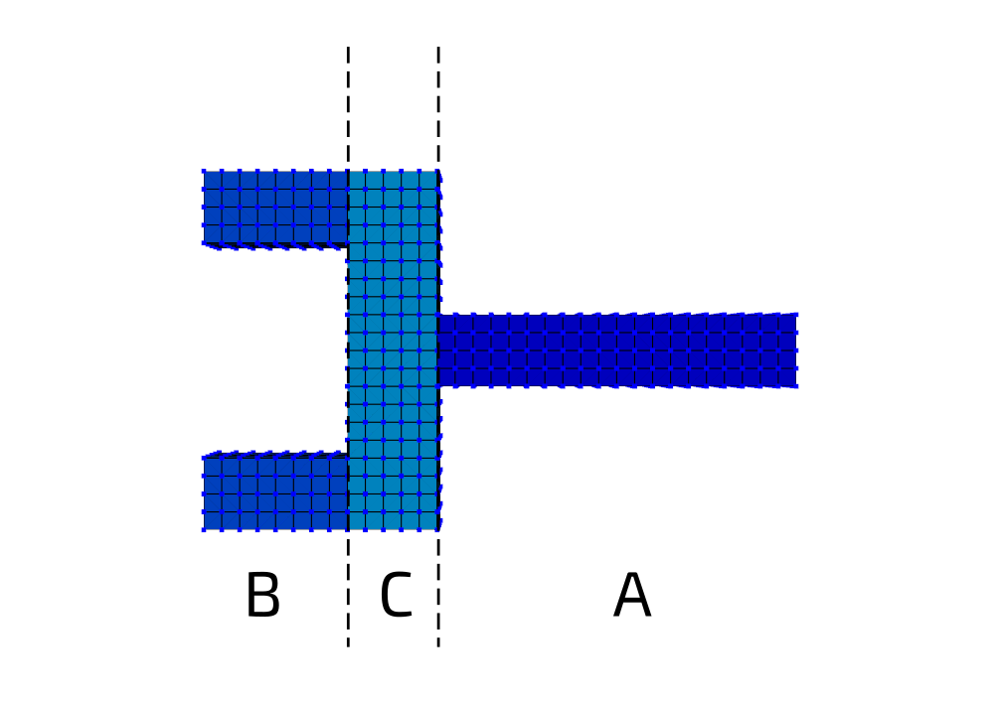

Substructures used in this work consist of various portions of this model, shown in subsequent figures, with the end goal of reconstructing the dynamics of the full ABC system.

| System A  | System A-2 | System AC | System C | System BC
|---|---|---|---|---|
| 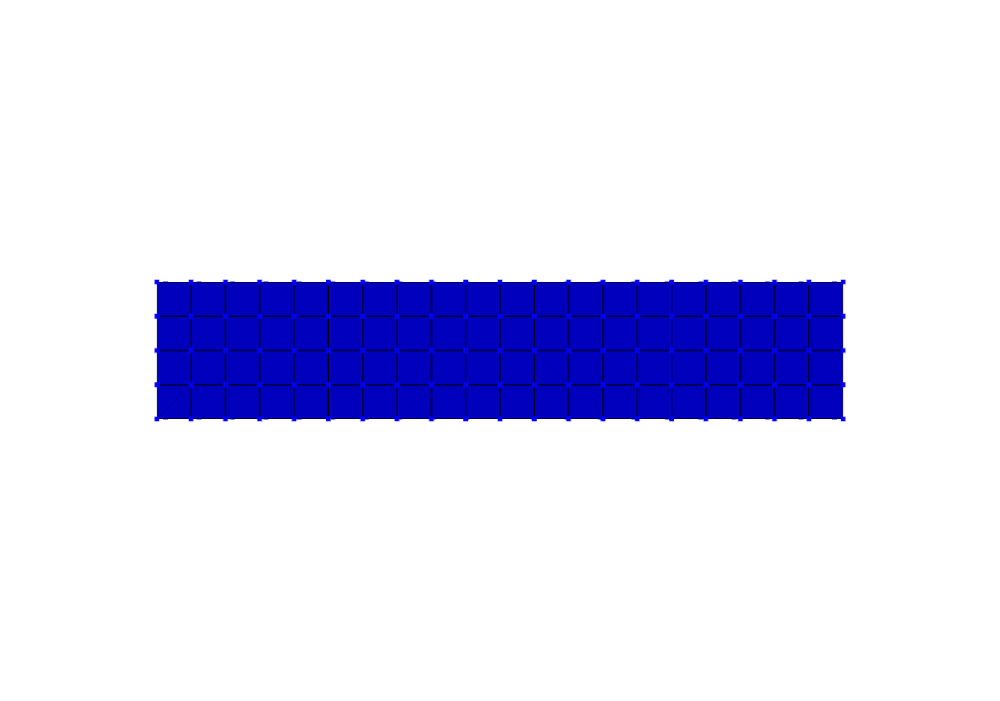  | 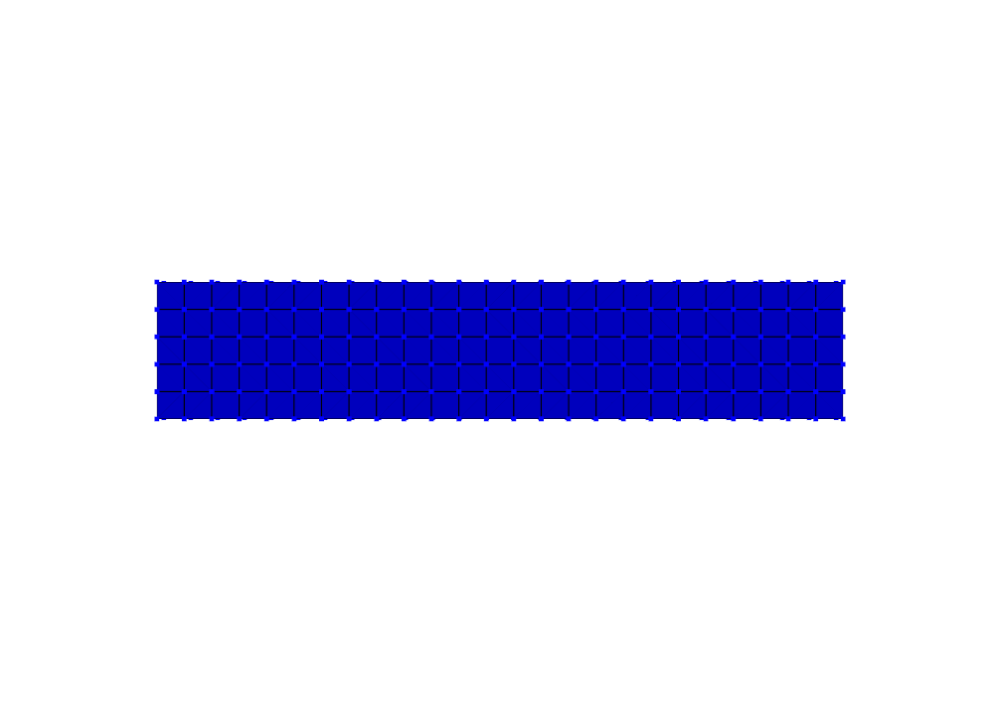  | 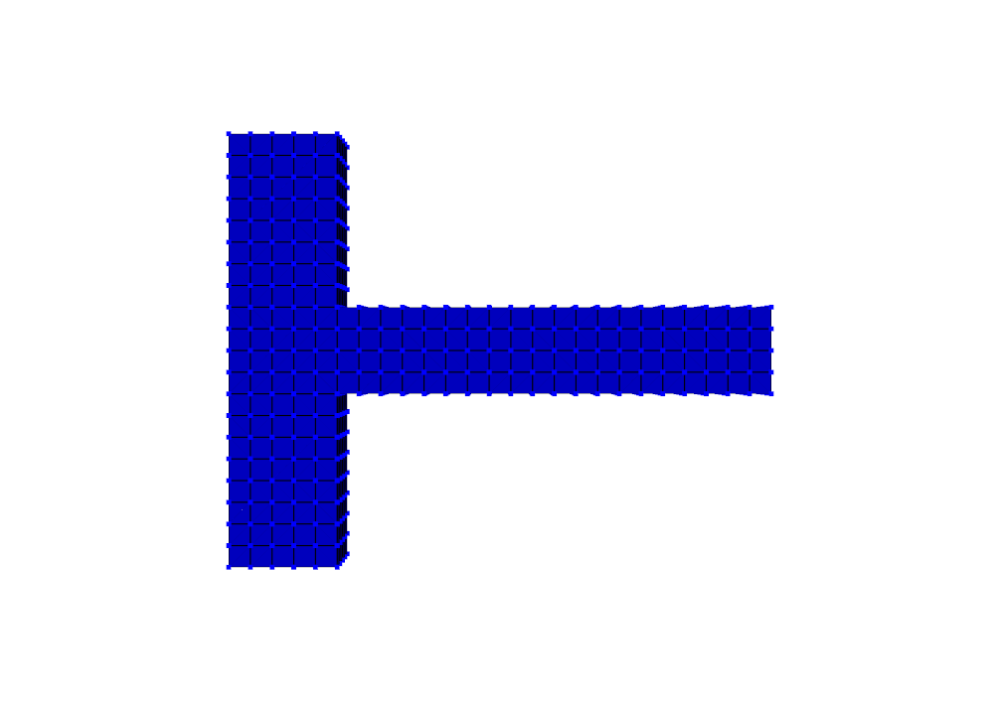 | 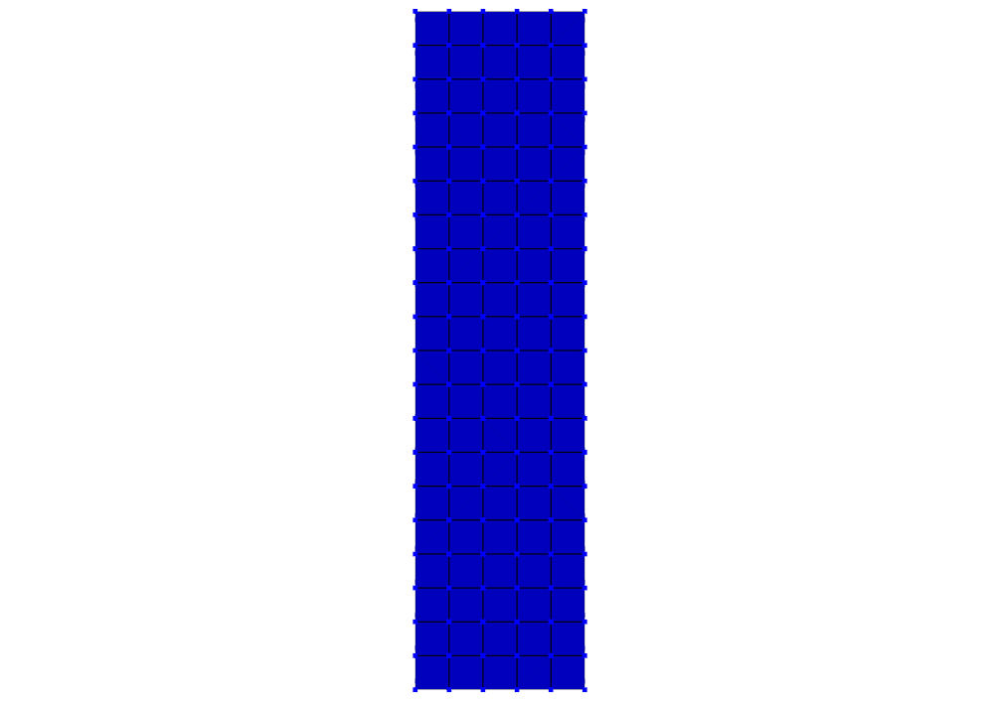 | 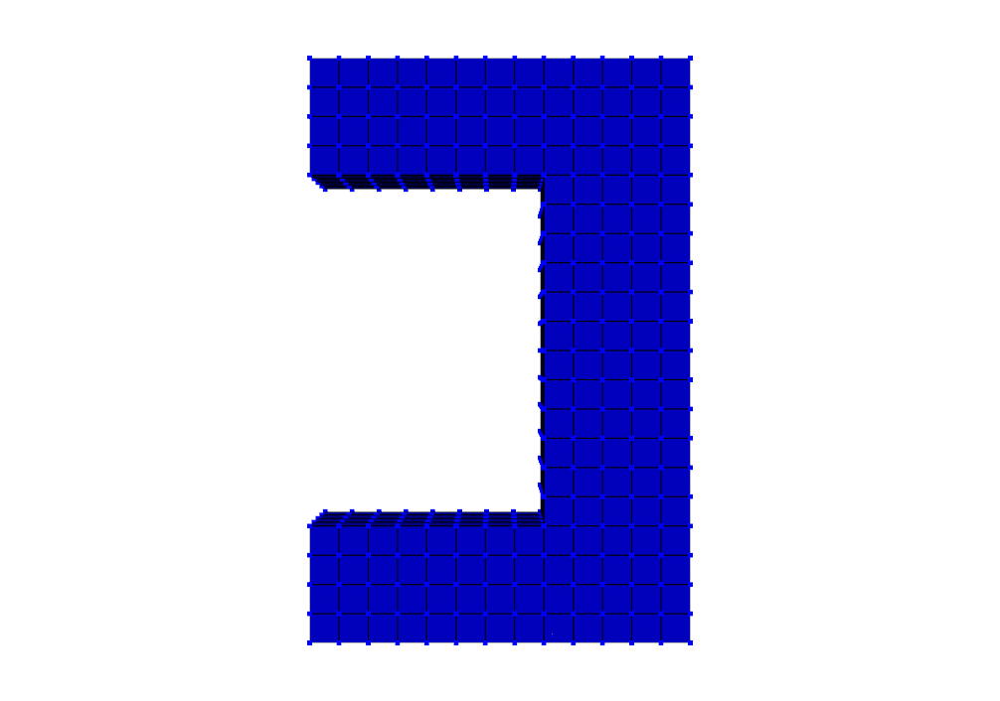|

System A-2 is equivalent geometrically to System A, but it has a finer mesh resolution.

In [2]:
geo = {}
sys = {}
shp = {}
for label in ['abc','a','c','ac','bc','a2']:
    exo = sdpy.Exodus(f"assets/block_{label}-eig.exo")
    geo[label] = sdpy.geometry.from_exodus(exo)
    geo[label].element.color = 1
    shp[label] = sdpy.shape.from_exodus(exo)
    sys[label] = sdpy.System.from_sierra_sd_mfile_output(
        f"assets/block_{label}_Maa.m",f"assets/block_{label}_Kaa.m",
        f"assets/block_{label}_gid.m",f"assets/block_{label}_ASetMap.m")

## Substructuring Cases
The substructuring cases demonstrated in this paper are as follows:

 - **Case 0:** Constrain system A to ground to create a fixed-base model.  This is not directly comparable to the truth system ABC, but it demonstrates how degrees of freedom can be fixed using SDynPy.
 - **Case 1a:** Constrain system A to system BC.  This case will demonstrate a typical substructuring workflow using the ``substructure_by_coordinate`` substructuring approach.
 - **Case 1b:** Constrain system A to system BC.  This case will demonstrate the ``substructure_by_position`` substructuring approach, which greatly simplifies the Case 1a workflow.
 - **Case 2:** Constrain a modal representation of system A to a modal representation of system BC.  This case will demonstrate substructuring using reduced-order models.
 - **Case 3:** Constrain a Craig-Bampton representation of system A to a Craig-Bampton representation of system BC.  This case will demonstrate creating a Craig-Bampton model as well as the improved results compared to the modal modeling.
 - **Case 4:** Constrain a Craig-Bampton representation of system A to a modal representation of system BC.  This case will demonstrate mixing different ``System`` representations.
 - **Case 5:** Constrain system A-2 to system BC.  This case will demonstrate constraining two components without common interface degrees of freedom, since A-2 has a different mesh resolution than system A.
 - **Case 6:** Constrain a modal representation of system AC to a modal representation of system BC and subtract off a modal representation of system C.  This case will demonstrate shape-based constraints using ``substructure_by_shape`` where system C exists in both substructures and must then be subtracted away.
 - **Case 7:** Constrain an experimental modal representation of system AC to an analytical modal representation of system BC and subtract off an analytical modal representation of system C.  This case will demonstrate a typical experimental/analytical transmission simulator method substructuring case where the experimental substructure has a limited bandwidth and measurement point resolution.


### Case 0: Constrained to Ground

Case 0 will demonstrate fixing of substructure A to ground.  While it is not directly comparable to the truth system ABC, fixing degrees of freedom is a common operation in substructuring calculations, and therefore it was desirable to demonstrate in this paper.

The first step in this process is to determine the degrees of freedom that should be fixed.  In the case of System A, the end we wish to fix happens to lie with its X-coordinate at a value of 0.0625.  Therefore, we can use this quantity and the geometry operations available in SDynPy to select for first the nodes that lie at this X-coordinate, and then select the degrees of freedom assocated with these nodes.

In [3]:
fixed_end_nodes = geo['a'].node.id[
    abs(geo['a'].global_node_coordinate()[:,0] - 0.0625) < 0.01
    ]
fixed_dofs = sdpy.coordinate_array(fixed_end_nodes,['X+','Y+','Z+'],force_broadcast=True)
geo['a'].plot_coordinate(fixed_dofs,arrow_scale=0.025,label_dofs=True,opacity=0.25)

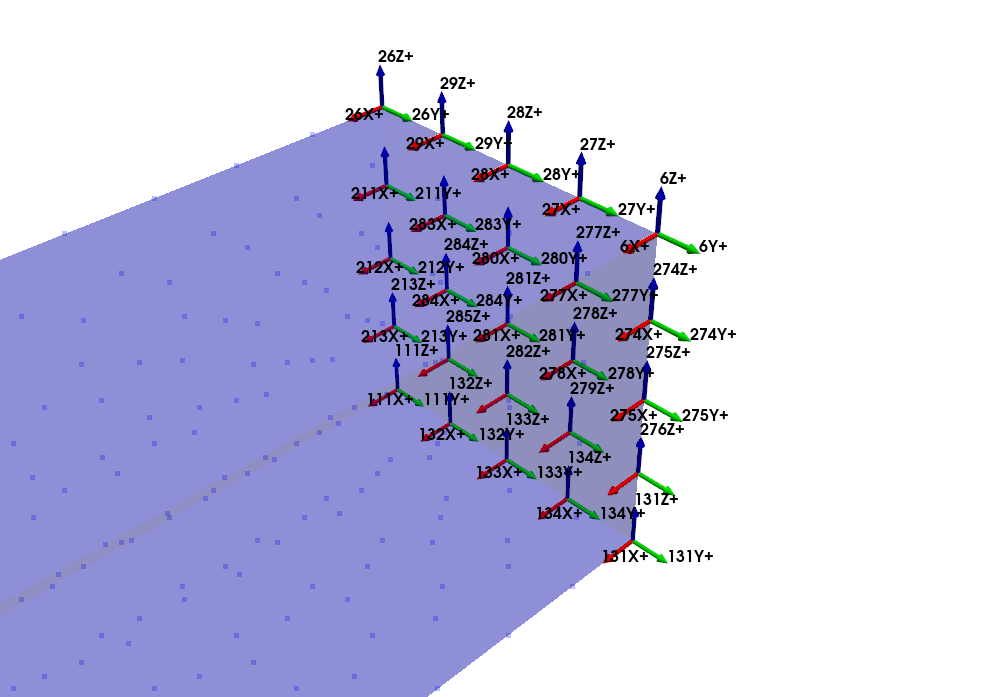

When substructuring directly using degrees of freedom, we will generally utilize the ``substructure_by_coordinate`` method in SDynPy.  This method requires us to provide pairs of degrees of freedom to constrain together.  If, instead of constraining two degrees of freedom together, we instead wish to constrain one degree of freedom to ground, we pair that degree of freedom with ``None`` instead of a second degree of freedom.

In [4]:
constraint_list = [(dof,None) for dof in fixed_dofs]

In [5]:
constrained_system = sys['a'].substructure_by_coordinate(constraint_list)

In [6]:
num_modes = 50
constrained_shapes = constrained_system.eigensolution(num_modes)
geo['a'].plot_shape(constrained_shapes)

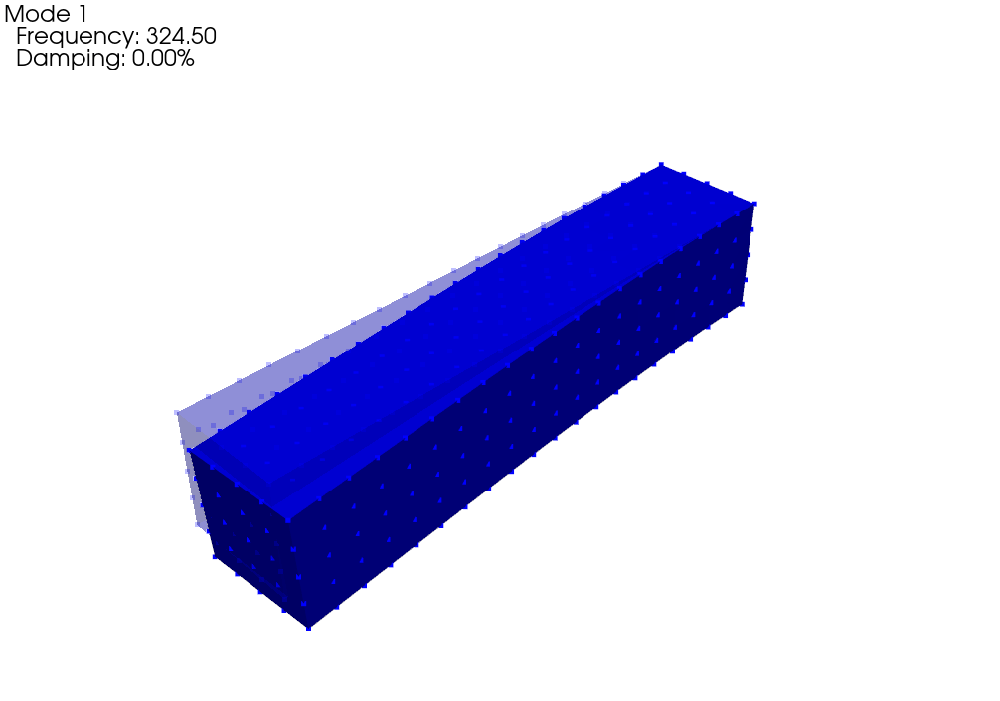

### Case 1a: Constrain System A to System BC

Case 1 will demonstrate perhaps the most common substructuring calculation; we have two substructures, A and BC, which have common interface degrees of freedom.  Each constraint we will apply will constrain one degree of freedom from system A to move identically to the corresponding degree of freedom in System B.  This case will be presented to show the full substructuring workflow, and the subsequent case will show how we can significantly streamline the analysis.

In [7]:
combined_geometry,node_offset = sdpy.Geometry.overlay_geometries(
    [geo['a'],geo['bc']],return_node_id_offset=True,color_override=[1,7])
combined_geometry.plot();

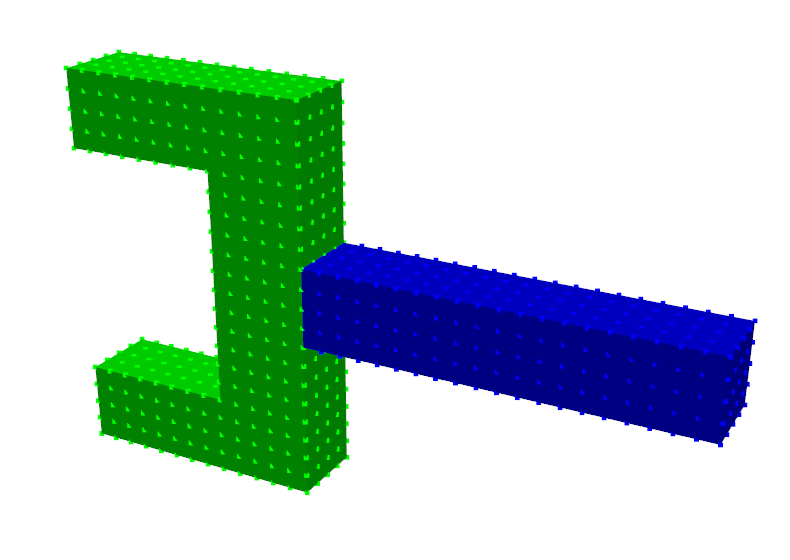

In [8]:
combined_system = sdpy.System.concatenate([sys['a'],sys['bc']],coordinate_node_offset=node_offset)

In [9]:
combined_shapes = combined_system.eigensolution(num_modes)
combined_geometry.plot_shape(combined_shapes)

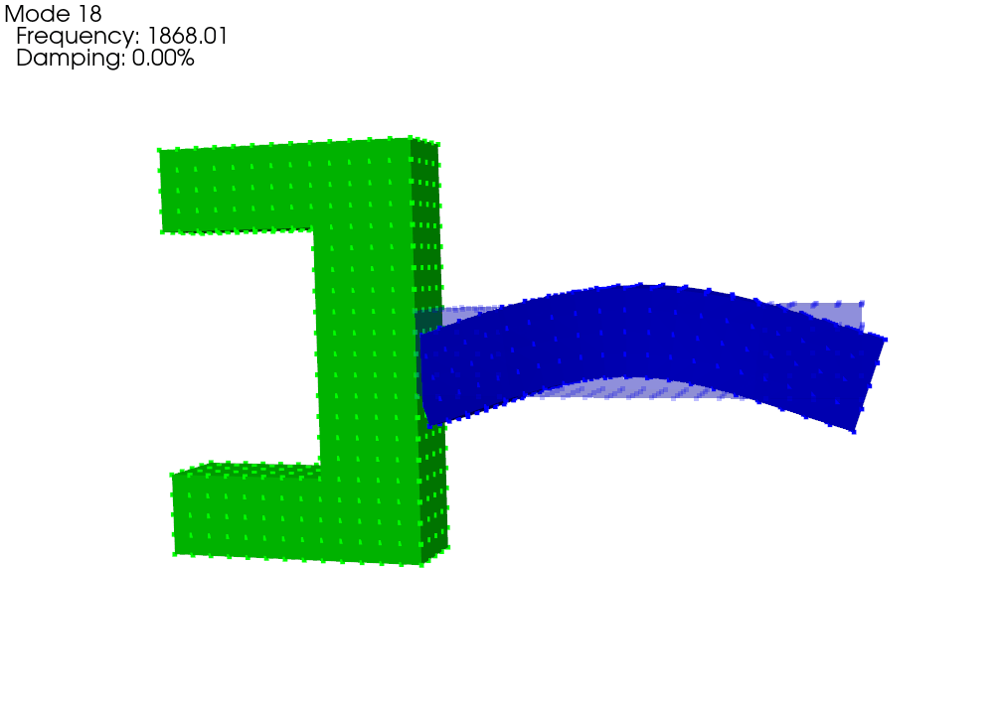

In [10]:
constraint_nodes = geo['a'].node.id[
    abs(geo['a'].global_node_coordinate()[:,0] - 0.0625) < 0.01
    ]
constraint_dofs = sdpy.coordinate_array(constraint_nodes,['X+','Y+','Z+'],force_broadcast=True)
geo['a'].plot_coordinate(constraint_dofs,arrow_scale=0.025,label_dofs=True,opacity=0.25)

In [11]:
corresponding_dofs = geo['a'].map_coordinate(constraint_dofs, geo['bc'], node_map='position')
# We can verify that they are correct correspondences, plot one of them as a spot check
correspondence_index = 10
geo['a'].plot_coordinate(constraint_dofs[correspondence_index],opacity=0.25)
geo['bc'].plot_coordinate(corresponding_dofs[correspondence_index],opacity=0.25)

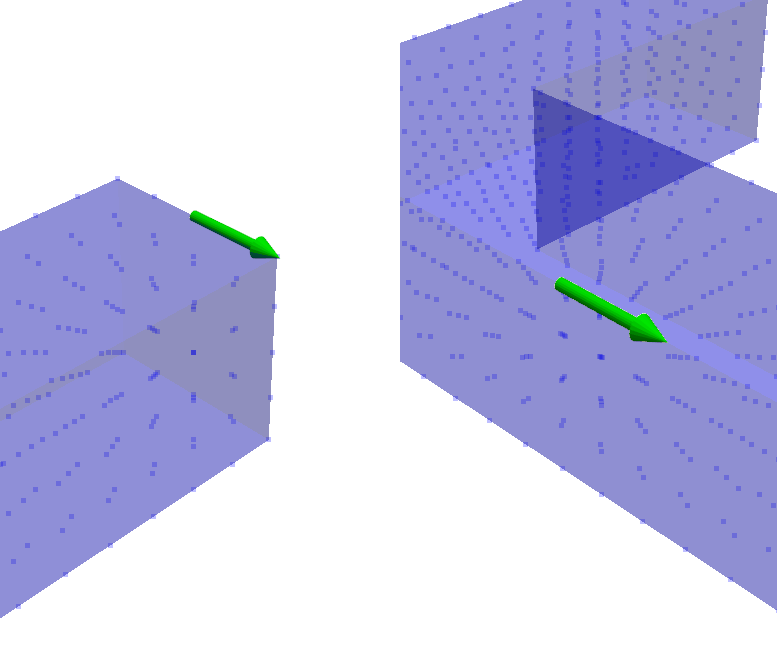

In [12]:
constraint_list = np.concatenate((constraint_dofs[:,np.newaxis],
                                  corresponding_dofs[:,np.newaxis]),axis=-1)
constraint_list.node = constraint_list.node + [node_offset,2*node_offset]

In [13]:
constrained_system = combined_system.substructure_by_coordinate(constraint_list)
constrained_shapes = constrained_system.eigensolution(num_modes)

Of course, we should check our work by plotting some mode shapes and comparing to the truth model from the finite element model.  SDynPy has many features for comparing different sets of data.  One might plot a modal assurance criteria matrix, overlay mode shapes, or plot frequencies in a table.  These are done here, but for brevity they will not be discussed in depth, as this document is meant to focus on the substructuring operations.  We will write a generic function to perform these operations, so it can be called for each case examined in this document.

In [14]:
def compare_to_truth(case_name,truth_geo,truth_shapes,compare_geo,compare_shapes):
    num_shapes = np.min([truth_shapes.size,compare_shapes.size])
    # Set up comparisons to the truth model
    check_nodes = compare_geo.node_by_global_position(truth_geo.global_node_coordinate())
    truth_node_ids = truth_geo.node.id
    # Make sure that a single check node is not associated with more than one
    # truth node
    if check_nodes.id.size != np.unique(check_nodes.id).size:
        # Go through and find the closest geometry node to each check node
        check_node_ids = np.unique(check_nodes.id)
        check_node_truth_pair = truth_geo.node_by_global_position(compare_geo.global_node_coordinate(check_node_ids))
        check_nodes = compare_geo.node_by_global_position(truth_geo.global_node_coordinate(check_node_truth_pair.id))
        truth_node_ids = check_node_truth_pair.id
    truth_map = sdpy.id_map(
        check_nodes.id,
        truth_node_ids
        )
    compare_shapes = compare_shapes.copy()
    print('{:} Results:'.format(case_name))
    # Find corresponding mode shapes
    full_mac = sdpy.shape.mac(truth_shapes[6:num_shapes].reduce(truth_node_ids),
                              compare_shapes[6:num_shapes].reduce(truth_map.from_ids),truth_map)
    truth_corr,compare_corr = np.where(full_mac > 0.4)
    
    print(sdpy.shape.shape_comparison_table(
        compare_shapes[compare_corr+6].reduce(truth_map.from_ids),
        truth_shapes[truth_corr+6].reduce(truth_node_ids),
        damping_format = None, node_id_map=truth_map.inverse()))
    alignment = sdpy.shape.shape_alignment(
        truth_shapes[truth_corr+6].reduce(truth_node_ids),
        compare_shapes[compare_corr+6].reduce(truth_map.from_ids),truth_map)
    compare_shapes.shape_matrix[compare_corr+6] = compare_shapes.shape_matrix[compare_corr+6]*alignment[:,np.newaxis]
    combined_geometry,combined_shapes = sdpy.shape.overlay_shapes(
        [truth_geo,compare_geo],
        [truth_shapes[truth_corr+6],compare_shapes[compare_corr+6]],
        [1,7])
    combined_shapes.comment1 = case_name
    combined_shapes.comment2 = 'Truth: Blue, Substructured: Green'
    for shape1,shape2,c in zip(
            truth_shapes[truth_corr+6].reduce(truth_node_ids),
            compare_shapes[compare_corr+6].reduce(truth_map.from_ids),
            combined_shapes):
        freq_error = (shape2.frequency-shape1.frequency)/shape1.frequency*100
        mac = sdpy.shape.mac(shape1[np.newaxis],shape2[np.newaxis],truth_map)[0,0]*100
        error_string = f'Truth: {shape1.frequency:0.2f} Hz; Substructured: {shape2.frequency:0.2f} Hz'
        c.comment3 = error_string
        error_string = f'Error: {freq_error:0.1f}%; MAC: {mac:0.2f}'
        c.comment4 = error_string
    plotter = combined_geometry.plot_shape(combined_shapes,undeformed_opacity=0,deformed_opacity=0.25)
    ax = sdpy.correlation.matrix_plot(full_mac,text_size=4)
    ax.set_title(case_name)
    
    return plotter, ax, sdpy.shape.shape_comparison_table(
        compare_shapes[compare_corr+6].reduce(truth_map.from_ids),
        truth_shapes[truth_corr+6].reduce(truth_node_ids),
        damping_format = None, node_id_map=truth_map.inverse(),table_format='markdown')

We can call this function with our results to generate the visualizations.

Case 1a Results:
  Mode  Freq 1 (Hz)  Freq 2 (Hz)  Freq Error  MAC
     1       463.46       463.46       -0.0%  100
     2       585.95       585.95        0.0%  100
     3       750.96       750.96        0.0%  100
     4       834.17       834.17        0.0%  100
     5      1368.49      1368.49        0.0%  100
     6      1434.50      1434.50        0.0%  100
     7      1458.50      1458.50        0.0%  100
     8      1665.14      1665.14        0.0%  100
     9      1727.17      1727.17        0.0%  100
    10      2021.03      2021.03        0.0%  100
    11      2766.90      2766.90        0.0%  100
    12      3138.37      3138.37        0.0%  100
    13      3432.29      3432.29        0.0%  100
    14      3765.91      3765.91        0.0%  100
    15      3870.86      3870.86        0.0%  100
    16      4062.56      4062.56       -0.0%  100
    17      4250.85      4250.85        0.0%  100
    18      4312.22      4312.22        0.0%  100
    19      4319.28      4319.28 

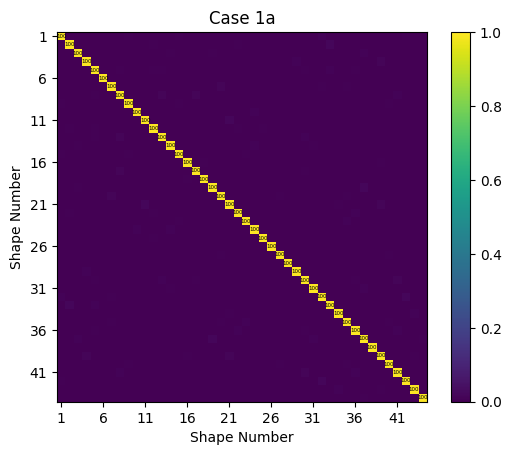

In [15]:
comparison_plotter, mac_ax, frequency_table = compare_to_truth(
        'Case 1a', geo['abc'], shp['abc'],
        combined_geometry, constrained_shapes)

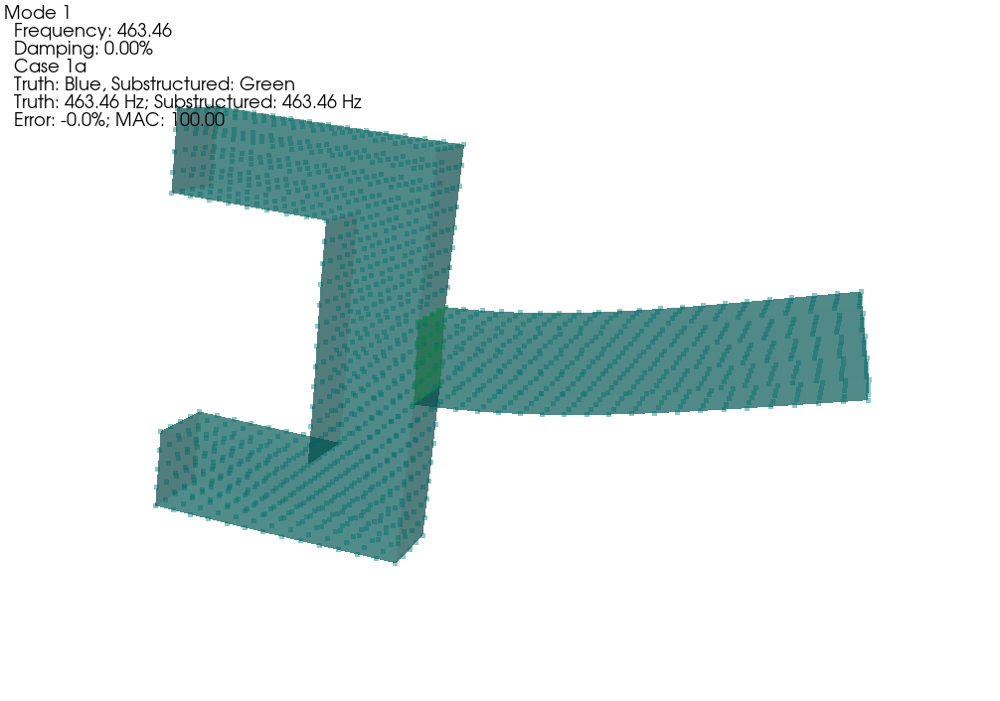

The substructured model is identical to the truth model, suggesting that all substructuring constraints and transformations back to physical space were applied correctly by SDynPy.

### Case 1b: Constrain System A to System BC

Case 1b Results:
  Mode  Freq 1 (Hz)  Freq 2 (Hz)  Freq Error  MAC
     1       463.46       463.46       -0.0%  100
     2       585.95       585.95       -0.0%  100
     3       750.96       750.96       -0.0%  100
     4       834.17       834.17       -0.0%  100
     5      1368.49      1368.49        0.0%  100
     6      1434.50      1434.50        0.0%  100
     7      1458.50      1458.50        0.0%  100
     8      1665.14      1665.14        0.0%  100
     9      1727.17      1727.17        0.0%  100
    10      2021.03      2021.03        0.0%  100
    11      2766.90      2766.90        0.0%  100
    12      3138.37      3138.37        0.0%  100
    13      3432.29      3432.29        0.0%  100
    14      3765.91      3765.91        0.0%  100
    15      3870.86      3870.86        0.0%  100
    16      4062.56      4062.56        0.0%  100
    17      4250.85      4250.85        0.0%  100
    18      4312.22      4312.22        0.0%  100
    19      4319.28      4319.28 

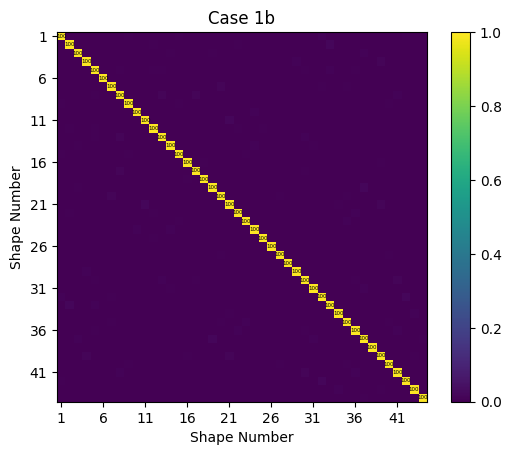

In [16]:
# Perform the substructuring
constrained_system, combined_geometry = sdpy.System.substructure_by_position(
    [sys['a'],sys['bc']],
    [geo['a'],geo['bc']])
# Compare results
constrained_shapes = constrained_system.eigensolution(num_modes)
comparison_plotter, mac_ax, latex_table = compare_to_truth(
        'Case 1b', geo['abc'], shp['abc'],
        combined_geometry, constrained_shapes)

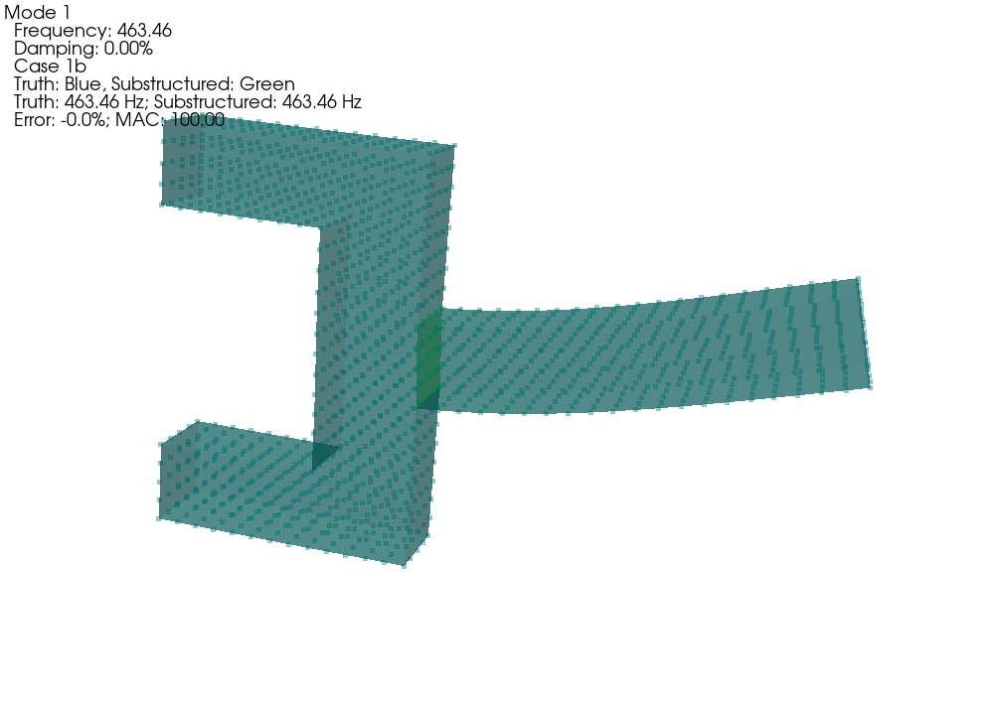

### Case 2: Constrain a Modal Representation of System A to a Modal Representation of System BC

In [17]:
modal_sys_a = sys['a'].eigensolution(105).system()
modal_sys_bc = sys['bc'].eigensolution(105).system()

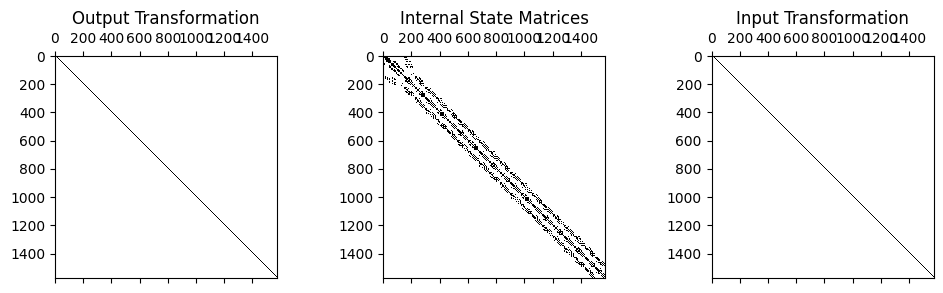

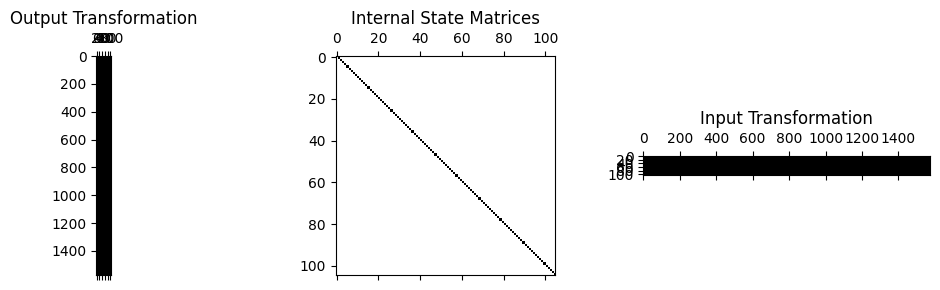

In [18]:
sys['a'].spy();
modal_sys_a.spy();

The top figure shows the physical system matrices; note the diagonal transformation matrices, which are the identity matrix, and the non-diagonal state matrices, which shows coupling between the various physical degrees of freedom.  The bottom figure shows the modal system matrices; note the full transformation matrices, which are the mode shape matrices, and the diagonal state matrices, which is expected from a modal solution.  Note also that the physical system shows over 1500 degrees of freedom, while the modal system only shows 105 degrees of freedom, which is the number of modes used to construct the system.

Case 2 Results:
  Mode  Freq 1 (Hz)  Freq 2 (Hz)  Freq Error  MAC
     1       712.21       463.46       53.7%   52
     2       721.52       463.46       55.7%   41
     3       712.21       585.95       21.5%   44
     4       721.52       585.95       23.1%   55
     5       977.59       750.96       30.2%   95
     6      1134.62       834.17       36.0%   98
     7      1710.81      1368.49       25.0%   55
     8      1727.99      1434.50       20.5%   97
     9      1662.56      1458.50       14.0%   95
    10      2729.07      1727.17       58.0%   71
    11      2947.27      2021.03       45.8%   85
    12      2986.11      2766.90        7.9%   96
    13      3434.21      3138.37        9.4%   96
    14      2829.45      3432.29      -17.6%   58
    15      4125.19      3765.91        9.5%   91
    16      4800.14      4062.56       18.2%   60
    17      4746.24      4250.85       11.7%   85
    18      5128.22      4312.22       18.9%   60
    19      5934.53      4319.28  

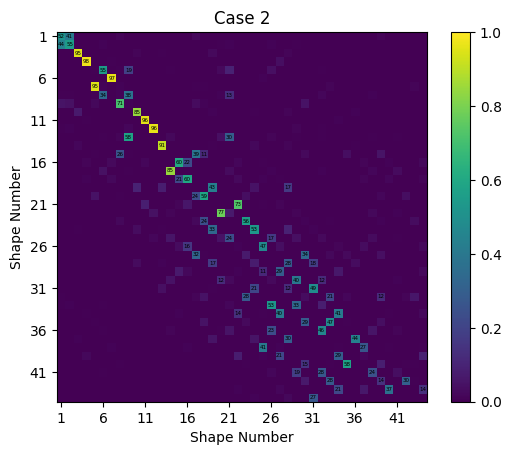

In [19]:
# Perform substructuring
constrained_system, combined_geometry = sdpy.System.substructure_by_position(
    [modal_sys_a,modal_sys_bc],
    [geo['a'],geo['bc']])
# Compare results
constrained_shapes = constrained_system.eigensolution(num_modes)
comparison_plotter, mac_ax, latex_table = compare_to_truth('Case 2', geo['abc'], shp['abc'],
                     combined_geometry, constrained_shapes)


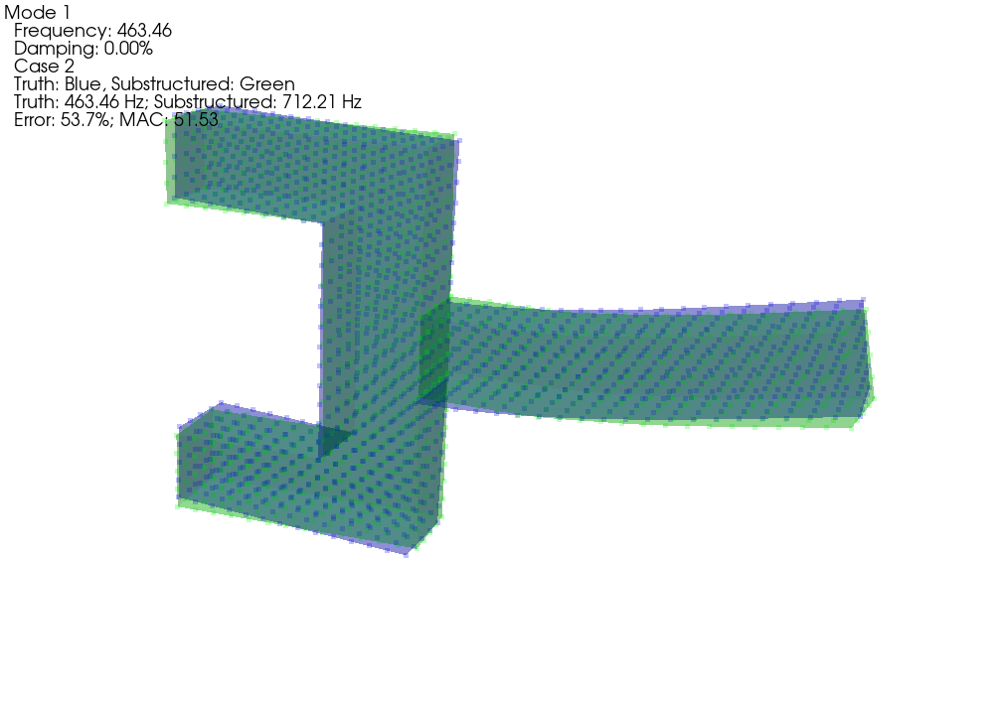

### Case 3: Constrain a Craig-Bampton representation of system A to a Craig-Bampton representation of system BC
We saw in the previous case that poor results were obtained when using a reduced-order model consisting of the free modes of the substructures.  However, other reduction bases can provide better results.  For example, the well-known Craig-Bampton representation is a very good reduced-order model for substructuring applications.

To construct a Craig-Bampton representation in SDynPy, one must specify the degrees of freedom to use as the interface degrees of freedom, from which static deflection shapes will be constructed, as well as the number of fixed-base modes to keep.  We will start by selecting the interface degrees of freedom, which follows a similar procedure to the one used to select the degrees of freedom to constrain in Case 1a.

In [20]:
constraint_nodes = geo['a'].node.id[
    abs(geo['a'].global_node_coordinate()[:,0] - 0.0625) < 0.01
    ]
constraint_dofs = sdpy.coordinate_array(constraint_nodes,['X+','Y+','Z+'],force_broadcast=True)
corresponding_dofs = geo['a'].map_coordinate(constraint_dofs, geo['bc'], node_map='position')

In [21]:
num_cbr_modes = 30
sys_cb_a = sys['a'].reduce_craig_bampton(constraint_dofs, num_cbr_modes)
sys_cb_bc = sys['bc'].reduce_craig_bampton(corresponding_dofs, num_cbr_modes)

In [22]:
geo['a'].plot_shape(sys_cb_a.transformation_shapes())
geo['bc'].plot_shape(sys_cb_bc.transformation_shapes())

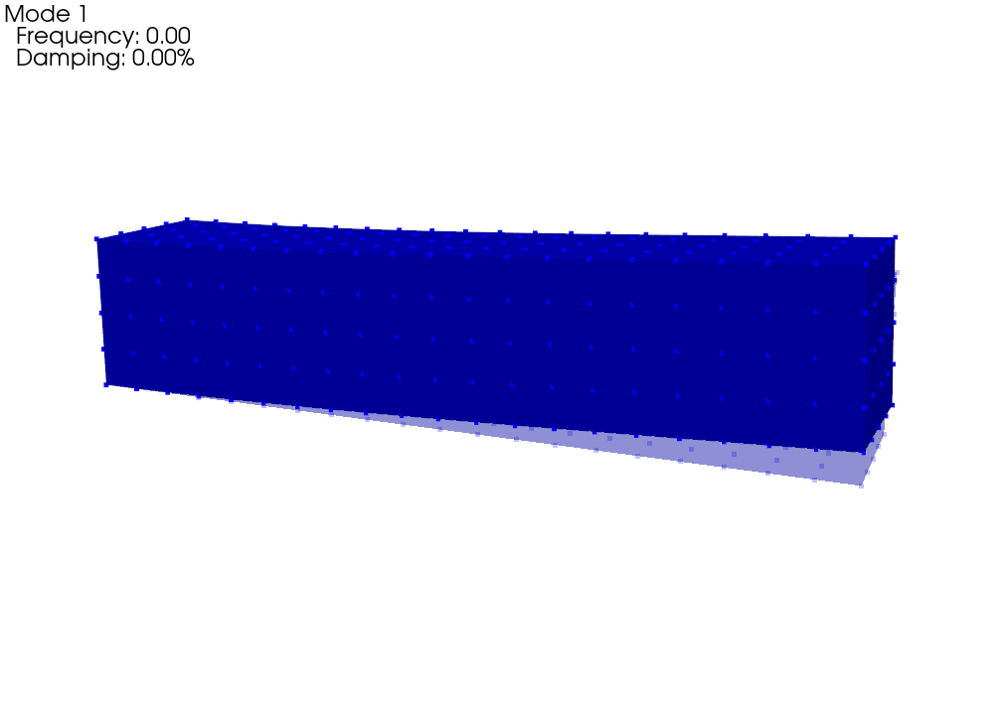
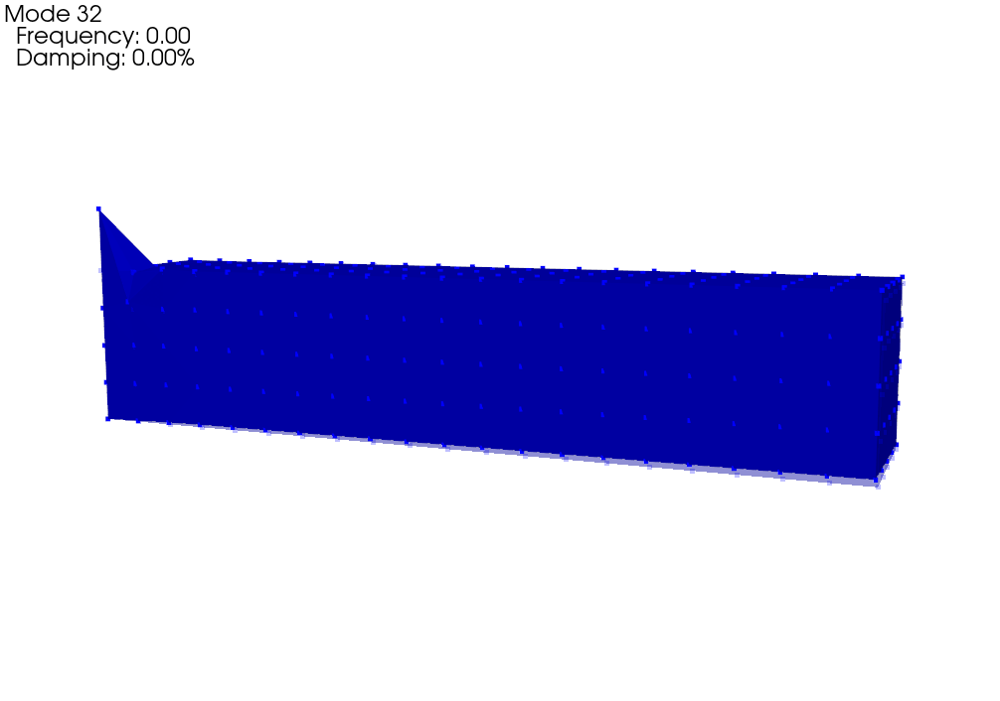

We can then constrain the reduced substructures as before.

Case 3 Results:
  Mode  Freq 1 (Hz)  Freq 2 (Hz)  Freq Error  MAC
     1       463.46       463.46        0.0%  100
     2       585.96       585.95        0.0%  100
     3       750.96       750.96        0.0%  100
     4       834.17       834.17        0.0%  100
     5      1368.52      1368.49        0.0%  100
     6      1434.50      1434.50        0.0%  100
     7      1458.52      1458.50        0.0%  100
     8      1665.30      1665.14        0.0%  100
     9      1727.18      1727.17        0.0%  100
    10      2021.07      2021.03        0.0%  100
    11      2767.00      2766.90        0.0%  100
    12      3140.80      3138.37        0.1%  100
    13      3432.48      3432.29        0.0%  100
    14      3767.55      3765.91        0.0%  100
    15      3871.50      3870.86        0.0%  100
    16      4063.53      4062.56        0.0%  100
    17      4251.80      4250.85        0.0%  100
    18      4312.29      4312.22        0.0%  100
    19      4319.99      4319.28  

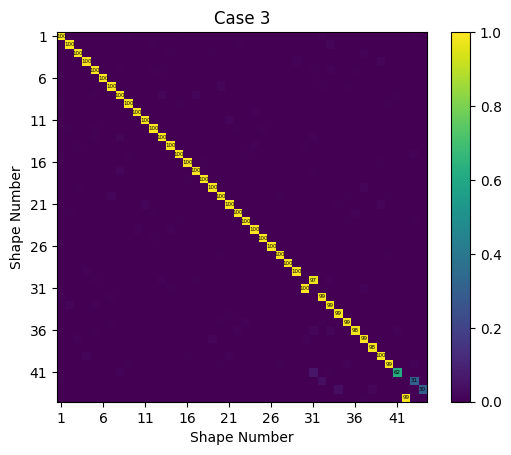

In [23]:
# Perform the constraints
constrained_system, combined_geometry = sdpy.System.substructure_by_position(
    [sys_cb_a,sys_cb_bc],
    [geo['a'],geo['bc']])
constrained_shapes = constrained_system.eigensolution(num_modes)
comparison_plotter, mac_ax, latex_table = compare_to_truth('Case 3', geo['abc'], shp['abc'],
                     combined_geometry, constrained_shapes)

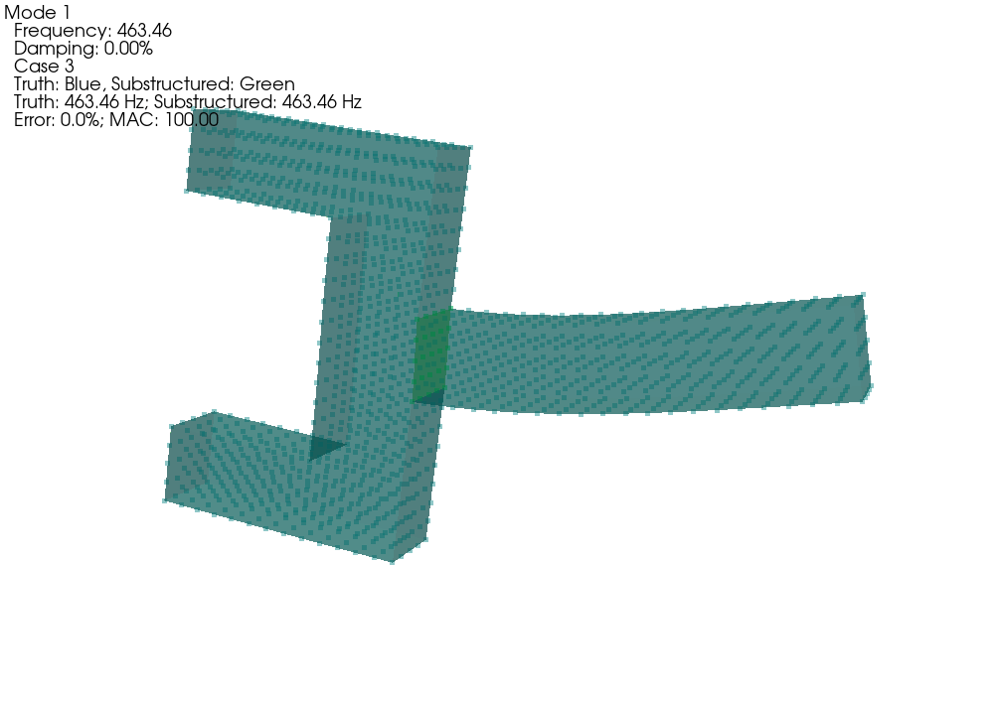

We see the results using Craig-Bampton substructure models are much better than the results obtained using free modes of the substructures, noting that Case 2 and Case 3 both used substructure systems with the same number of degrees of freedom.  The substructures in Case 2 used 105 free modes of the structures, and the substructures in Case 3 used substructures with 75 interface degrees of freedom (25 nodes each with three translational degrees of freedom) and 30 fixed-interface modes.

### Case 4: Constrain a Craig-Bampton Representation of System A to a Modal Representation of System BC

Case 4 Results:
  Mode  Freq 1 (Hz)  Freq 2 (Hz)  Freq Error  MAC
     1       483.69       463.46        4.4%  100
     2       605.51       585.95        3.3%  100
     3       758.37       750.96        1.0%  100
     4       842.58       834.17        1.0%  100
     5      1378.94      1368.49        0.8%  100
     6      1461.73      1434.50        1.9%  100
     7      1459.36      1458.50        0.1%  100
     8      1677.23      1665.14        0.7%  100
     9      1780.78      1727.17        3.1%  100
    10      2071.32      2021.03        2.5%  100
    11      2769.30      2766.90        0.1%  100
    12      3172.44      3138.37        1.1%  100
    13      3440.45      3432.29        0.2%  100
    14      3801.95      3765.91        1.0%  100
    15      3927.86      3870.86        1.5%  100
    16      4113.57      4062.56        1.3%   98
    17      4292.42      4250.85        1.0%  100
    18      4351.40      4312.22        0.9%   98
    19      4346.18      4319.28  

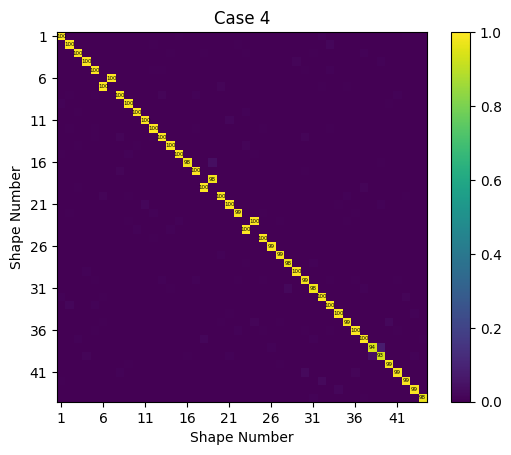

In [24]:
# Perform the constraints
constrained_system, combined_geometry = sdpy.System.substructure_by_position(
    [sys_cb_a,modal_sys_bc],
    [geo['a'],geo['bc']])
constrained_shapes = constrained_system.eigensolution(num_modes)
comparison_plotter, mac_ax, latex_table = compare_to_truth('Case 4', geo['abc'], shp['abc'],
                     combined_geometry, constrained_shapes)

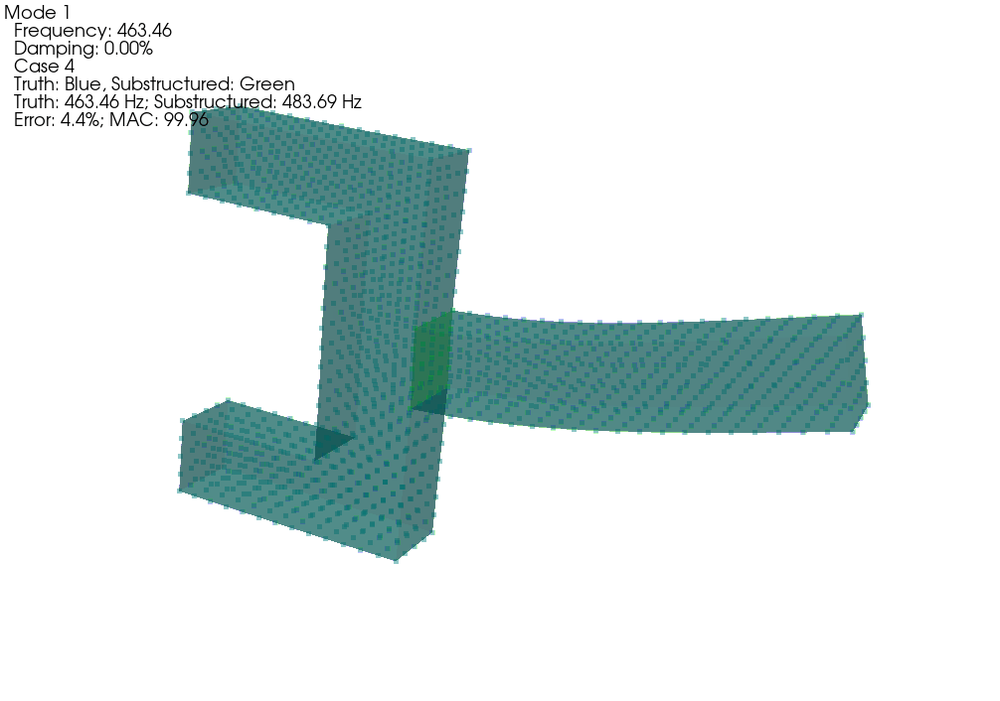

Interestingly, this results in significantly improved results over Case 2, even through a substructure with free modes are used.  This is likely due to there being strain at the interface in the free mode shapes of System BC, unlike the interface in the free modes of System A.

### Case 5: Constrain System A-2 to System BC

All previous cases have considered the situation where the degrees of freedom to be combined between the substructures are directly co-located.  However, there are cases when the degrees of freedom that must be constrained do not map one-to-one across the substructuring interface.  This can occur when different groups build the substructure models, or when experimental models are used.

In this case, we will consider the problem where we again constrain System A to System BC.  However, in this case, we use System A-2, which is geometrically the same as System A, except it has a finer mesh resolution, so the degrees of freedom do not map one-to-one.  Utilizing the ``substructure_by_position`` method would result in poor results, because only the nodes at the corners of System A-2 would be constrained to System BC.

In [25]:
combined_geometry,node_offset = sdpy.Geometry.overlay_geometries(
    [geo['a2'],geo['bc']],return_node_id_offset=True,color_override=[1,7])
combined_geometry.plot(show_edges=True);

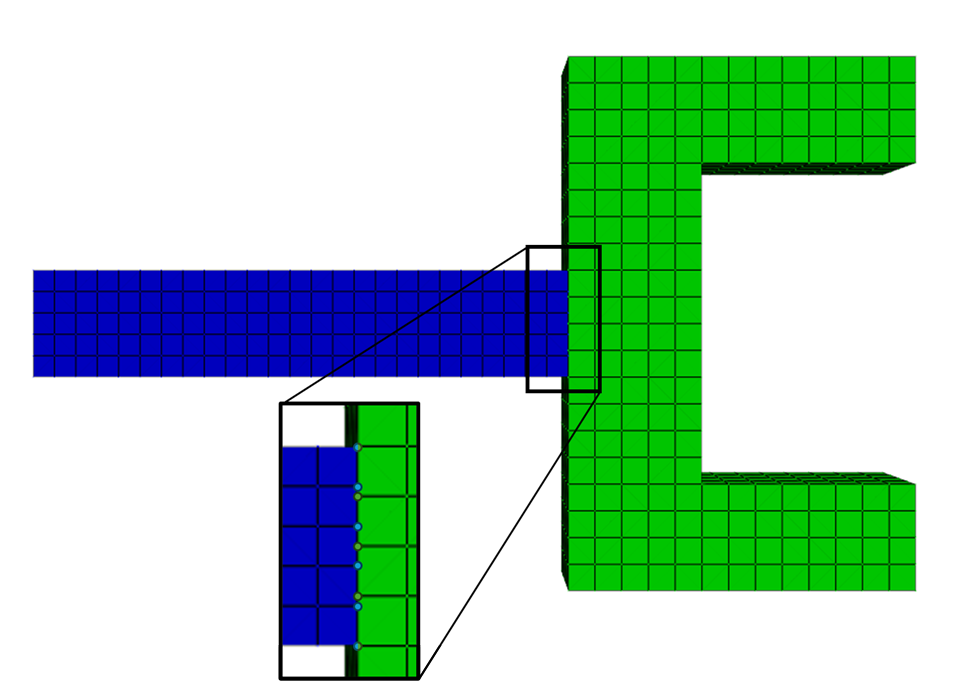

In this case, we will use a set of shapes to provide the constraints.  We effectively fit motions at the interface to a set of basis shapes, and then constrain those shape coefficients to one another.

Often when using shape-based constraints, a physically-based set of shapes is used, for example, the mode shapes of one of the structures.  However, we have seen in Case 2 that the free shapes do not provide a good basis set of shapes for the motions seen at the interface.  Therefore, we will instead use Legendre Polynomials as the basis functions.  These polynomials look somewhat like plate bending modes, and therefore should adequately capture the motions of the interfaces.  The SciPy package contains Legendre polynomials in its ``scipy.special`` module.

In [26]:
from scipy.special import legendre
import scipy.linalg as la

We will begin as before by selecting the degrees of freedom at the interface for each subsystem based on geometry.  We can plot these degrees of freedom to ensure they have been selected correctly..

In [27]:
constraint_nodes_a = geo['a2'].node.id[
    abs(geo['a2'].global_node_coordinate()[:,0] - 0.0625) < 0.01
    ]
constraint_dofs_a = sdpy.coordinate_array(constraint_nodes_a,['X+','Y+','Z+'],force_broadcast=True)
geo['a2'].plot_coordinate(constraint_dofs_a,arrow_scale=0.025,label_dofs=True,opacity=0.25)

global_coords_bc = geo['bc'].global_node_coordinate()
constraint_nodes_bc = geo['bc'].node.id[
    (abs(global_coords_bc[:,0] - 0.0625) < 0.01) & 
    (abs(global_coords_bc[:,1]) < 0.051)
    ]
constraint_dofs_bc = sdpy.coordinate_array(constraint_nodes_bc,['X+','Y+','Z+'],force_broadcast=True)
geo['bc'].plot_coordinate(constraint_dofs_bc,arrow_scale=0.025,label_dofs=True,opacity=0.25)

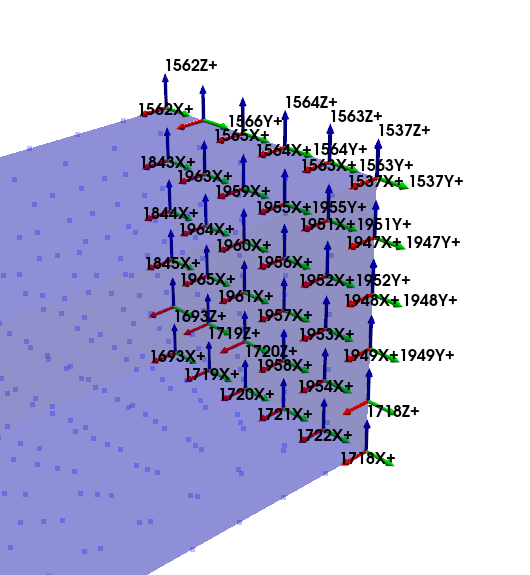
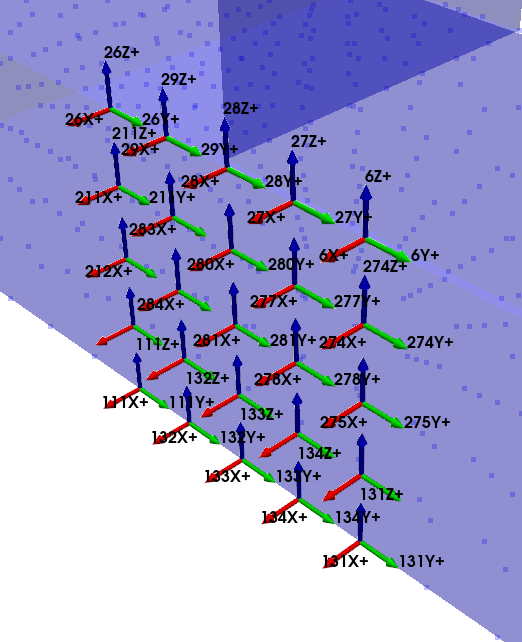

In [28]:
# We'll get the node positions in the combined geometry to help us compute the
# coefficients.  Remember the node offset!
constraint_nodes = np.concatenate((constraint_nodes_a + node_offset,
                                   constraint_nodes_bc + 2*node_offset))
constraint_node_positions = combined_geometry.global_node_coordinate(constraint_nodes)
# Normalize the Y and Z positions of the nodes across the interface
y_range = np.min(constraint_node_positions[:,1]),np.max(constraint_node_positions[:,1])
z_range = np.min(constraint_node_positions[:,2]),np.max(constraint_node_positions[:,2])
transformed_constraint_positions = np.array([
    (constraint_node_positions[:,1]-y_range[0])/np.diff(y_range)*2-1,
    (constraint_node_positions[:,2]-z_range[0])/np.diff(z_range)*2-1,
    ]).T
# Now we will specify the polynomial orders that we wish to solve for
polynomial_orders = 3
# And loop through the polynomial orders in y and z to compute the polynomial
# shapes
legendre_shapes = []
orders = []
for order_y in range(polynomial_orders):
    polyy = legendre(order_y)
    legendre_y = polyy(transformed_constraint_positions[:,0])
    for order_z in range(polynomial_orders):
        polyz = legendre(order_z)
        legendre_z = polyz(transformed_constraint_positions[:,1])
        orders.append([order_y,order_z])
        legendre_shapes.append(legendre_y*legendre_z)
legendre_shapes = np.array(legendre_shapes)
orders = np.array(orders)
# Now we can compute a SDynPy shape object from these shape coefficients
# We will make a block diagonal matrix to represent motions in X, Y, and Z
shape_matrix = la.block_diag(legendre_shapes,legendre_shapes,legendre_shapes)
shape_coordinates = sdpy.coordinate_array(constraint_nodes,[['X+'],['Y+'],['Z+']]).flatten()
frequency = np.concatenate((np.sum(orders,axis=1),
                            np.sum(orders,axis=1),
                            np.sum(orders,axis=1)))
comment1 = ( ['X: {:},{:}'.format(*order) for order in orders]
            +['Y: {:},{:}'.format(*order) for order in orders]
            +['Z: {:},{:}'.format(*order) for order in orders])
constraint_shapes = sdpy.shape_array(shape_coordinates,shape_matrix,
                                     frequency,
                                     comment1=comment1)
# Now to verify we got the shapes right, we should plot them
combined_geometry.plot_shape(constraint_shapes,deformed_opacity=0.25,undeformed_opacity=0)

Node 11531 not found in shape array
...
Node 21530 not found in shape array


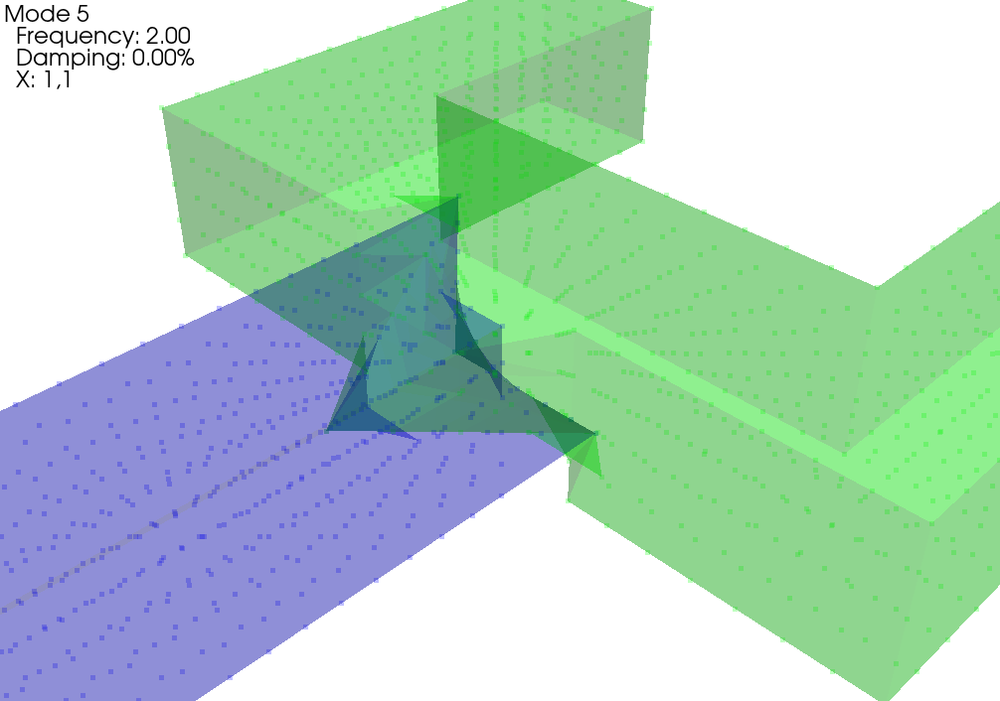

In [29]:
combined_system = sdpy.System.concatenate([sys['a2'],sys['bc']],node_offset)

In [30]:
constraint_dofs_a = sdpy.coordinate_array(constraint_nodes_a + node_offset,
                                          ['X+','Y+','Z+'], force_broadcast=True)
constraint_dofs_bc = sdpy.coordinate_array(constraint_nodes_bc + 2*node_offset,
                                           ['X+','Y+','Z+'], force_broadcast=True)

Case 5 Results:
  Mode  Freq 1 (Hz)  Freq 2 (Hz)  Freq Error  MAC
     1       462.35       463.46       -0.2%  100
     2       577.02       585.95       -1.5%  100
     3       750.23       750.96       -0.1%  100
     4       830.98       834.17       -0.4%  100
     5      1364.08      1368.49       -0.3%  100
     6      1416.13      1434.50       -1.3%   98
     7      1457.99      1458.50       -0.0%  100
     8      1660.34      1665.14       -0.3%  100
     9      1720.72      1727.17       -0.4%   99
    10      2017.65      2021.03       -0.2%  100
    11      2765.48      2766.90       -0.1%  100
    12      3116.44      3138.37       -0.7%   99
    13      3429.44      3432.29       -0.1%  100
    14      3763.84      3765.91       -0.1%  100
    15      3842.25      3870.86       -0.7%   99
    16      4023.49      4062.56       -1.0%   97
    17      4228.80      4250.85       -0.5%  100
    18      4292.33      4312.22       -0.5%   98
    19      4315.78      4319.28  

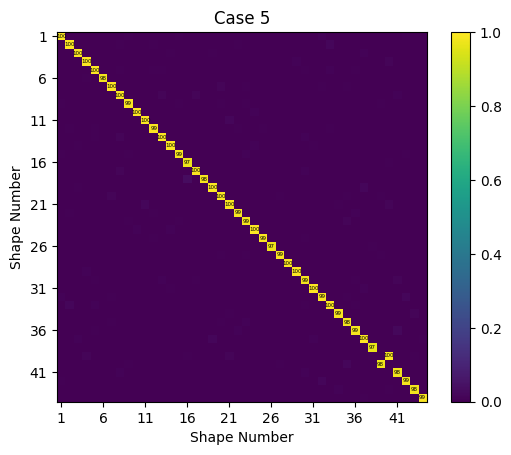

In [31]:
constrained_system = combined_system.substructure_by_shape(constraint_shapes,
                                                           constraint_dofs_a,
                                                           constraint_dofs_bc)
# Compare results
constrained_shapes = constrained_system.eigensolution(num_modes)
comparison_plotter, mac_ax, latex_table = compare_to_truth('Case 5', geo['abc'], shp['abc'],
                     combined_geometry, constrained_shapes)

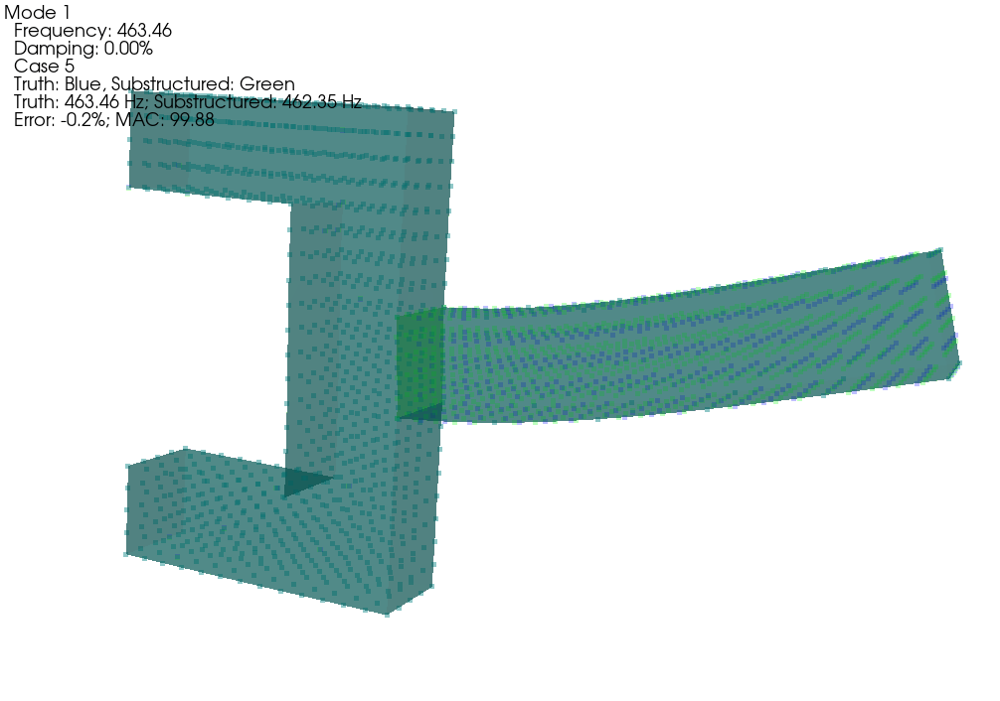

We can see that we obtain very good results using this substructuring approach.  The frequencies from the assembled model are slightly lower than the truth model likely due to System A-2 being slightly softer than System A due to the mesh refinement.  Even though the degrees of freedom at the interfaces between the substructures are not identical and therefore cannot be directly constrained to move together, the motions at those degrees of freedom can be represented accurately by polynomial-based shape functions which can instead be constrained to move together.

We note that although the construction of the constraint shapes for substructuring was somewhat manual, we were still able to use the tools in SDynPy to verify the correct construction of these shapes prior to the substructuring calculation being performed.  This significantly aids the user in identifying errors in constructing the constraint shapes.

### Case 6: Constrain a modal representation of system AC to a modal representation of system BC and subtract off a modal representation of system C

In [32]:
combined_geometry,node_offset = sdpy.Geometry.overlay_geometries(
    [geo['ac'],geo['bc'],geo['c']],return_node_id_offset=True,
    color_override=[1,7,11]) # Blue, Green, Red
combined_geometry.plot(opacity=0.25)

(<sdynpy.core.sdynpy_geometry.GeometryPlotter at 0x1f782bb19a0>,
 None,
 PolyData (0x1f782b7b0a0)
   N Cells:    2790
   N Points:   2790
   N Strips:   0
   X Bounds:   -2.625e-01, 5.625e-01
   Y Bounds:   -2.500e-01, 2.500e-01
   Z Bounds:   -5.000e-02, 5.000e-02
   N Arrays:   2,
 UnstructuredGrid (0x1f76fb65a20)
   N Cells:    1776
   N Points:   2790
   X Bounds:   -2.625e-01, 5.625e-01
   Y Bounds:   -2.500e-01, 2.500e-01
   Z Bounds:   -5.000e-02, 5.000e-02
   N Arrays:   1)

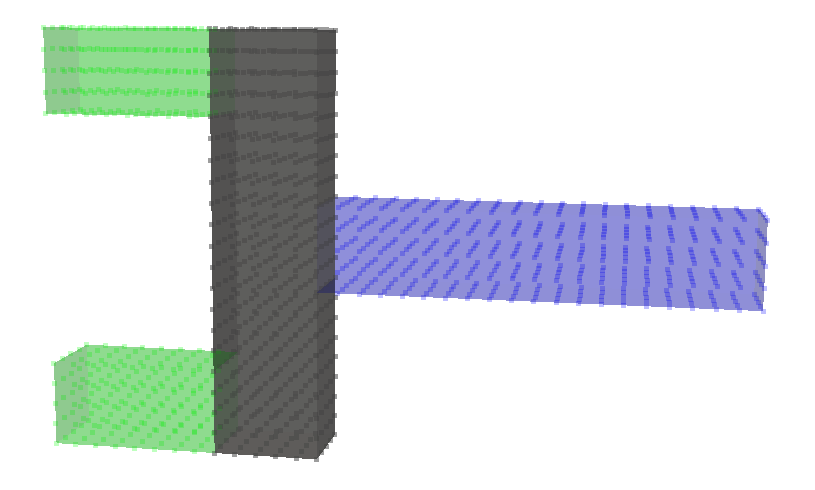

Text(0.5, 1.0, 'TS coefficients for BC modes')

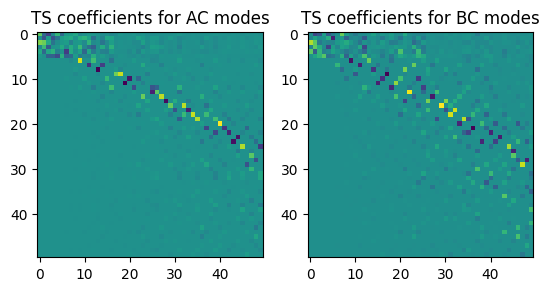

In [33]:
# Select degrees of freedom
constraint_dofs_c = sdpy.coordinate_array(geo['c'].node.id,['X+','Y+','Z+'],force_broadcast=True)
constraint_dofs_bc = geo['c'].map_coordinate(constraint_dofs_c,geo['bc'],node_map='position')
constraint_dofs_ac = geo['c'].map_coordinate(constraint_dofs_c,geo['ac'],node_map='position')

# Extract shape matrices
shape_matrix_c = sys['c'].eigensolution(num_modes)[constraint_dofs_c].T
shape_matrix_bc = sys['bc'].eigensolution(num_modes)[constraint_dofs_bc].T
shape_matrix_ac = sys['ac'].eigensolution(num_modes)[constraint_dofs_ac].T

# Perform the modal filter
modal_coefficients_bc = np.linalg.pinv(shape_matrix_c)@shape_matrix_bc
modal_coefficients_ac = np.linalg.pinv(shape_matrix_c)@shape_matrix_ac

# Plot the results
fig,ax = plt.subplots(1,2)
ax[0].imshow(modal_coefficients_ac)
ax[1].imshow(modal_coefficients_bc)
ax[0].set_title('TS coefficients for AC modes')
ax[1].set_title('TS coefficients for BC modes')

From the previous figure, we see we will need to use about 30 modes of system C to cover 50 modes of Systems AC and BC.  Therefore, we will construct reduced-order models of these systems containing those modes.

In [34]:
num_modes_bc = 50
num_modes_ac = 50
num_modes_c = 30
num_constraint_shapes = 30
modal_system_ac = sys['ac'].eigensolution(num_modes_ac).system()
modal_system_bc = sys['bc'].eigensolution(num_modes_bc).system()
modal_system_c = sys['c'].eigensolution(num_modes_c).system()

In [35]:
combined_system = sdpy.System.concatenate((modal_system_ac,modal_system_bc,-modal_system_c),
                                          node_offset)

In [36]:
# Get the mode shapes
shapes_c = modal_system_c.eigensolution(num_constraint_shapes)
# Extract shape coefficients at the requested degrees of freedom
shape_matrix = shapes_c[constraint_dofs_c]
# The full matrix will repeat this matrix 3x
full_shape_matrix = np.concatenate((shape_matrix,shape_matrix,shape_matrix),axis=-1)
# Apply the node offsets to our lists of constraint degrees of freedom
constraint_dofs_ac.node = constraint_dofs_ac.node + node_offset
constraint_dofs_bc.node = constraint_dofs_bc.node + 2*node_offset
constraint_dofs_c.node = constraint_dofs_c.node + 3*node_offset
# Assemble degrees of freedom into one list
constraint_dofs = np.concatenate([constraint_dofs_ac,constraint_dofs_bc,
                                  constraint_dofs_c])
# Construct the constraint shapes.
constraint_shapes = sdpy.shape_array(
    constraint_dofs,full_shape_matrix)

If we plot the constraint shapes on the combined geometry, we should see the System C portion of all three substructures moving in the mode shapes of System C.  SDynPy makes it easy to verify that we've set up the constraint shapes correctly by plotting the shapes.

In [37]:
combined_geometry.plot_shape(constraint_shapes,undeformed_opacity=0,deformed_opacity=0.25)

Node 10001 not found in shape array
...
Node 21100 not found in shape array


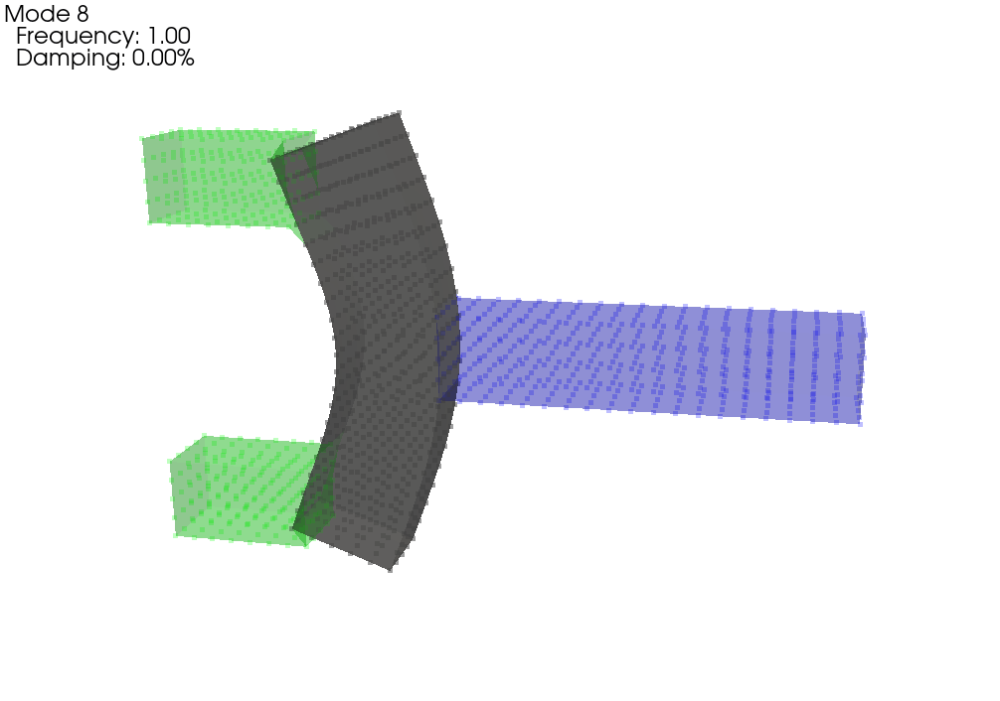

Case 6 Results:
  Mode  Freq 1 (Hz)  Freq 2 (Hz)  Freq Error  MAC
     1       463.95       463.46        0.1%  100
     2       584.56       585.95       -0.2%  100
     3       748.59       750.96       -0.3%  100
     4       833.86       834.17       -0.0%  100
     5      1367.79      1368.49       -0.1%  100
     6      1440.92      1434.50        0.4%  100
     7      1463.11      1458.50        0.3%  100
     8      1663.66      1665.14       -0.1%  100
     9      1725.24      1727.17       -0.1%  100
    10      2049.77      2021.03        1.4%  100
    11      2873.85      2766.90        3.9%   99
    12      3142.64      3138.37        0.1%  100
    13      3436.96      3432.29        0.1%  100
    14      3767.00      3765.91        0.0%  100
    15      3871.88      3870.86        0.0%  100
    16      4107.97      4062.56        1.1%   94
    17      4254.27      4250.85        0.1%  100
    18      4396.10      4312.22        1.9%   94
    19      4331.83      4319.28  

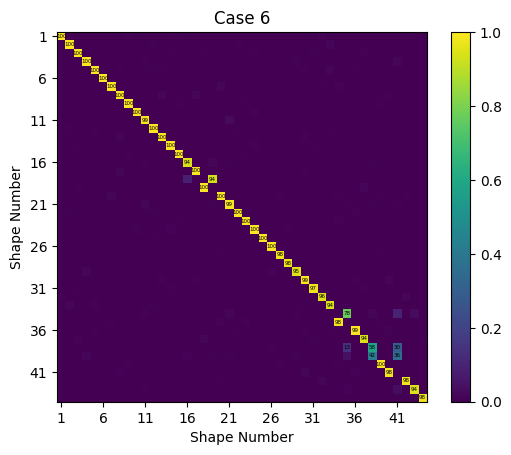

In [38]:
# Create the constraint matrix between AC and C
constraint_matrix_ac_c = combined_system.substructure_by_shape(
    constraint_shapes,
    constraint_dofs_ac,
    constraint_dofs_c,
    return_constrained_system=False)
# Create the constraint matrix between BC and C
constraint_matrix_bc_c = combined_system.substructure_by_shape(
    constraint_shapes,
    constraint_dofs_bc,
    constraint_dofs_c,
    return_constrained_system=False)
# Stack the constraint matrices into a single constraint matrix
constraint_matrix = np.concatenate((constraint_matrix_ac_c,constraint_matrix_bc_c),axis=0)
# Apply the constraints to the system
constrained_system = combined_system.constrain(constraint_matrix)
# Compare results
constrained_shapes = constrained_system.eigensolution(num_modes)
comparison_plotter, mac_ax, latex_table = compare_to_truth('Case 6', geo['abc'], shp['abc'],
                     combined_geometry, constrained_shapes)

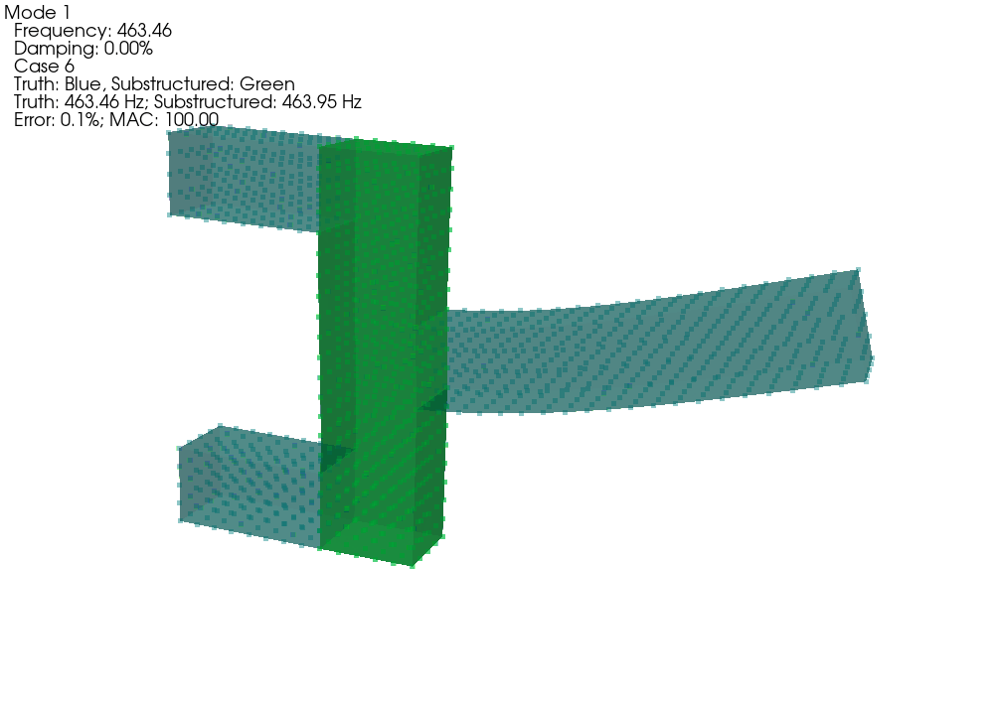

We can see we obtain very accurate results in this case, with good mode shape agreement and most frequency errors less than 1\%.

### Case 7: Constrain an Experimental Modal Representation of System AC to an Analytical Modal Representation of System BC and Subtract off an Analytical Modal Representation of System C

The final case examined in this paper is an example of Experimental-to-Analytical substructuring using the same Systems as Case 6.  In this case, we assume System AC was measured experimentally; it has a much sparser instrumentation set of 20 triaxial sensors and a limited bandwidth up to 4000 Hz.  We assume as before that we have analytical models of System BC and the transmission simulator C.

In [39]:
# Set the number of sensors to keep
num_triax_sensors = 20
# Compute the modes the system up to 4000 Hz
modes_ac = sys['ac'].eigensolution(maximum_frequency=4000)
# Select sensor locations based on effective independence
optimal_shapes = modes_ac.optimize_degrees_of_freedom(
    num_triax_sensors,group_by_node=True)
optimal_dofs = np.unique(optimal_shapes.coordinate)
test_nodes = np.unique(optimal_dofs.node)
# Reduce the analytical geometry to just the test geometry
test_geometry = geo['ac'].reduce(test_nodes)
# Connect the remaining nodes with lines for visualization
test_geometry.add_traceline(
    [1,2,106,107,1,0, # 0 denotes a line break
     42,118,147,42,0,
     34,126,139,34,0,
     1146,676,722,1126,1146,0,
     1457,1472,0,
     556,560,596,580,556,0,
     1,42,34,0,
     107,118,126,0,
     106,147,139,0,
     1146,556,0,
     1126,580,0,
     676,1457,560,0,
     722,1472,596])
# Create new node numbers for the nodes in the test
node_sorting = np.argsort(test_geometry.global_node_coordinate()[:,0])[::-1]
node_map = sdpy.id_map(
    test_geometry.node.id[node_sorting],
    np.arange(node_sorting.size)+101)
# Map the old nodes to the new nodes in the geometry
test_geometry = test_geometry.map_ids(node_id_map=node_map)
# Map the old nodes to the new nodes in the shapes
test_shapes = optimal_shapes.copy()
test_shapes.coordinate.node = node_map(test_shapes.coordinate.node)
# Plot the shapes and label the nodes
test_geometry.plot_shape(test_shapes,plot_kwargs={'label_nodes':True})
# Create the experimental modal system
test_system = test_shapes.system()

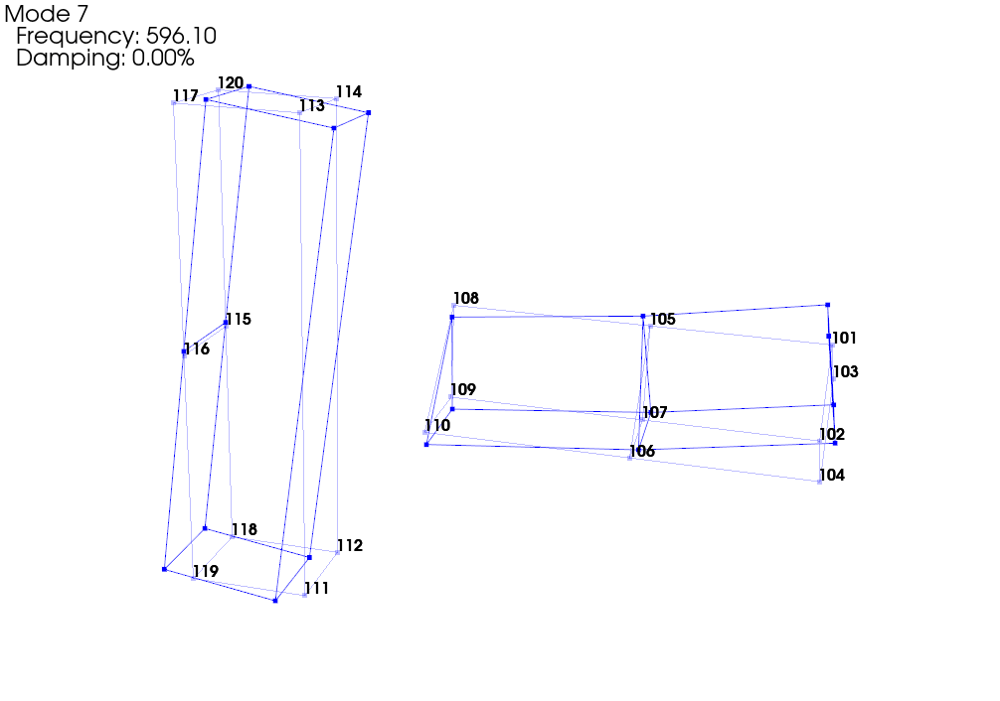

The case then proceeds similarly to Case 6.  We construct a combined geometry that will be used to visualize the results.

In [40]:
combined_geometry,node_offset = sdpy.Geometry.overlay_geometries(
    [test_geometry,geo['bc'],geo['c']],return_node_id_offset=True,
    color_override=[1,7,11]) # Blue, Green, Red

We then investigate the mode contributions in each substructure to see how many modes should be kept in the analytical substructures.  For the System BC to System C constraint, we can use all the degrees of System C.

In [41]:
constraint_dofs_c_bc = sdpy.coordinate_array(geo['c'].node.id,['X+','Y+','Z+'],force_broadcast=True)
constraint_dofs_bc = geo['c'].map_coordinate(constraint_dofs_c_bc,geo['bc'],node_map='position')

In [42]:
ac_nodes = test_geometry.node.id[test_geometry.global_node_coordinate()[:,0] < 0.062501]
constraint_dofs_ac = sdpy.coordinate_array(ac_nodes,['X+','Y+','Z+'],force_broadcast=True)
constraint_dofs_c_ac = test_geometry.map_coordinate(constraint_dofs_ac,geo['c'],node_map='position')

We can then create the shape matrices and perform the modal filtering.

Text(0.5, 1.0, 'TS coefficients for BC modes')

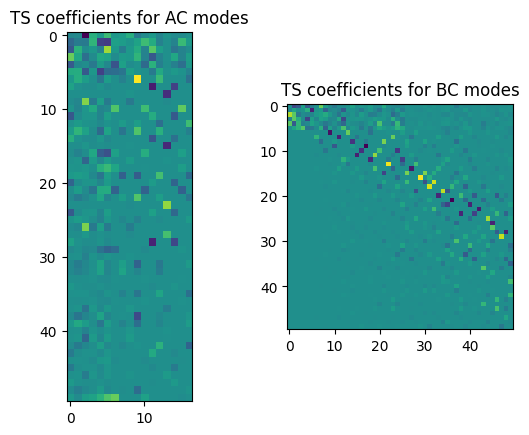

In [43]:
# Extract the shape matrices
shape_matrix_c_ac = sys['c'].eigensolution(num_modes)[constraint_dofs_c_ac].T
shape_matrix_c_bc = sys['c'].eigensolution(num_modes)[constraint_dofs_c_bc].T
shape_matrix_bc = sys['bc'].eigensolution(num_modes)[constraint_dofs_bc].T
shape_matrix_ac = test_system.eigensolution()[constraint_dofs_ac].T

# Compute the modal coefficients
modal_coefficients_bc = np.linalg.pinv(shape_matrix_c_bc)@shape_matrix_bc
modal_coefficients_ac = np.linalg.pinv(shape_matrix_c_ac)@shape_matrix_ac

# Plot the results
fig,ax = plt.subplots(1,2)
ax[0].imshow(modal_coefficients_ac)
ax[1].imshow(modal_coefficients_bc)
ax[0].set_title('TS coefficients for AC modes')
ax[1].set_title('TS coefficients for BC modes')

It looks like roughly 14 modes would be needed of System C to capture motions in the 16 modes of System AC up to 4000 Hz.  We will also keep 25 modes of System BC.  We will construct our modal systems using these modes and concatenate the systems together.

In [44]:
# Select numbers of modes and create modal systems
num_modes_bc = 25
num_modes_c = 14
num_constraint_shapes = 14
modal_system_bc = sys['bc'].eigensolution(num_modes_bc).system()
modal_system_c = sys['c'].eigensolution(num_modes_c).system()
# Concatenate the systems into a single system
combined_system = sdpy.System.concatenate((test_system,modal_system_bc,-modal_system_c),
                                              node_offset)

In [45]:
# Solve for the modes of C
shapes_c = modal_system_c.eigensolution(num_constraint_shapes)
# Extract the coefficients used in the constraints to assemble shape matrices
shape_matrix_analysis = shapes_c[constraint_dofs_c_bc]
shape_matrix_test = shapes_c[constraint_dofs_c_ac]
# Apply the node offsets for the combined geometry
constraint_dofs_ac.node = constraint_dofs_ac.node + node_offset
constraint_dofs_bc.node = constraint_dofs_bc.node + 2*node_offset
constraint_dofs_c_bc.node = constraint_dofs_c_bc.node + 3*node_offset
constraint_dofs = np.concatenate([constraint_dofs_ac,constraint_dofs_bc,
                                  constraint_dofs_c_bc])
# Construct the full shape matrix
shape_matrix = np.concatenate([shape_matrix_test,shape_matrix_analysis,
                               shape_matrix_analysis],axis=-1)
# Construct the shape array
constraint_shapes = sdpy.shape_array(
    constraint_dofs,shape_matrix)
# Plot the shape array
combined_geometry.plot_shape(constraint_shapes)

Node 10101 not found in shape array
...
Node 21100 not found in shape array


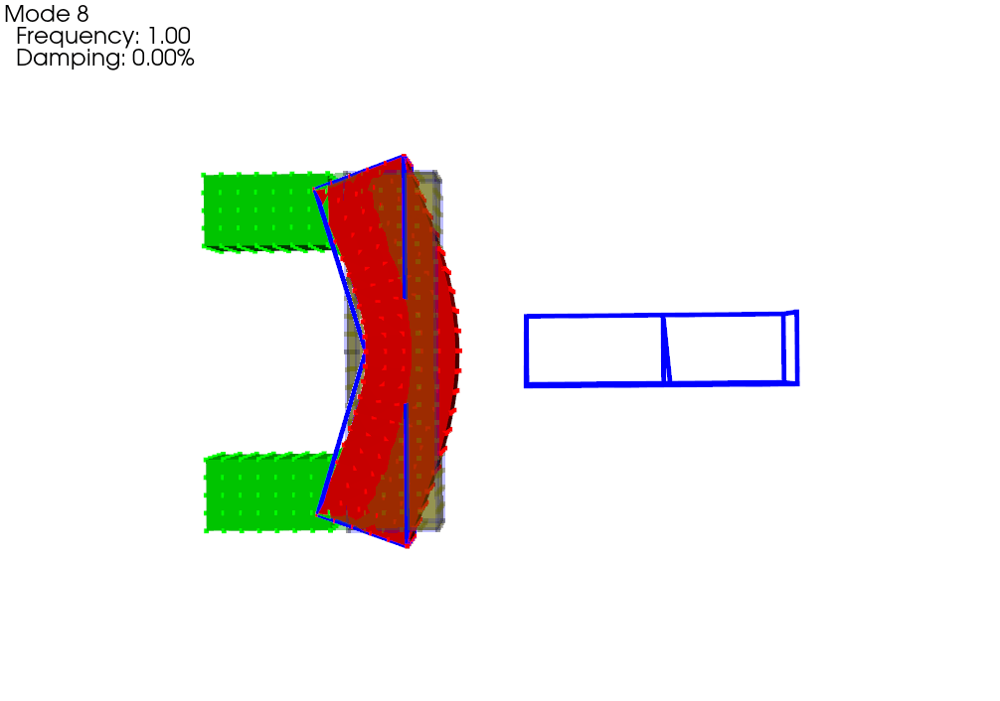

Case 7 Results:
  Mode  Freq 1 (Hz)  Freq 2 (Hz)  Freq Error  MAC
     1       464.71       463.46        0.3%  100
     2       594.46       585.95        1.5%  100
     3       760.13       750.96        1.2%  100
     4       827.97       834.17       -0.7%  100
     5      1383.69      1368.49        1.1%  100
     6      1432.82      1434.50       -0.1%   99
     7      1641.68      1458.50       12.6%   85
     8      1825.23      1458.50       25.1%   80
     9      1680.84      1665.14        0.9%  100
    10      1825.23      1727.17        5.7%   60
    11      2085.36      2021.03        3.2%   99
    12      3276.98      2766.90       18.4%   86
    13      3185.57      3138.37        1.5%   98
    14      4295.96      3138.37       36.9%   42
    15      3688.98      3432.29        7.5%   95
    16      3697.41      3765.91       -1.8%   89
    17      3891.54      3870.86        0.5%   90
    18      4197.73      4062.56        3.3%   79
    19      3185.57      4250.85  

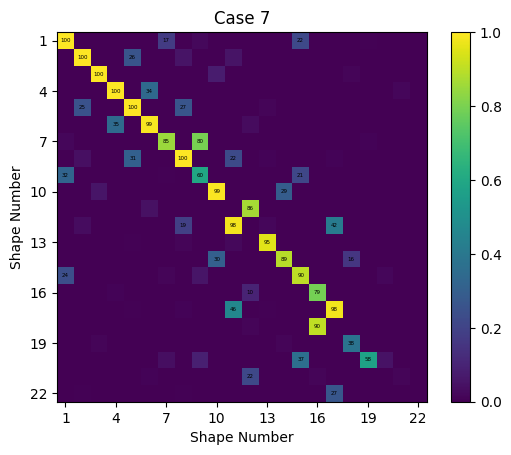

In [46]:
constraint_matrix_ac_c = combined_system.substructure_by_shape(
    constraint_shapes,
    constraint_dofs_ac,
    constraint_dofs_c_bc,
    return_constrained_system=False)
constraint_matrix_bc_c = combined_system.substructure_by_shape(
    constraint_shapes,
    constraint_dofs_bc,
    constraint_dofs_c_bc,
    return_constrained_system=False)
constraint_matrix = np.concatenate((constraint_matrix_ac_c,constraint_matrix_bc_c),axis=0)
constrained_system = combined_system.constrain(constraint_matrix)
# Compare results
constrained_shapes = constrained_system.eigensolution()
comparison_plotter, mac_ax, latex_table = compare_to_truth('Case 7', geo['abc'], shp['abc'],
                     combined_geometry, constrained_shapes)

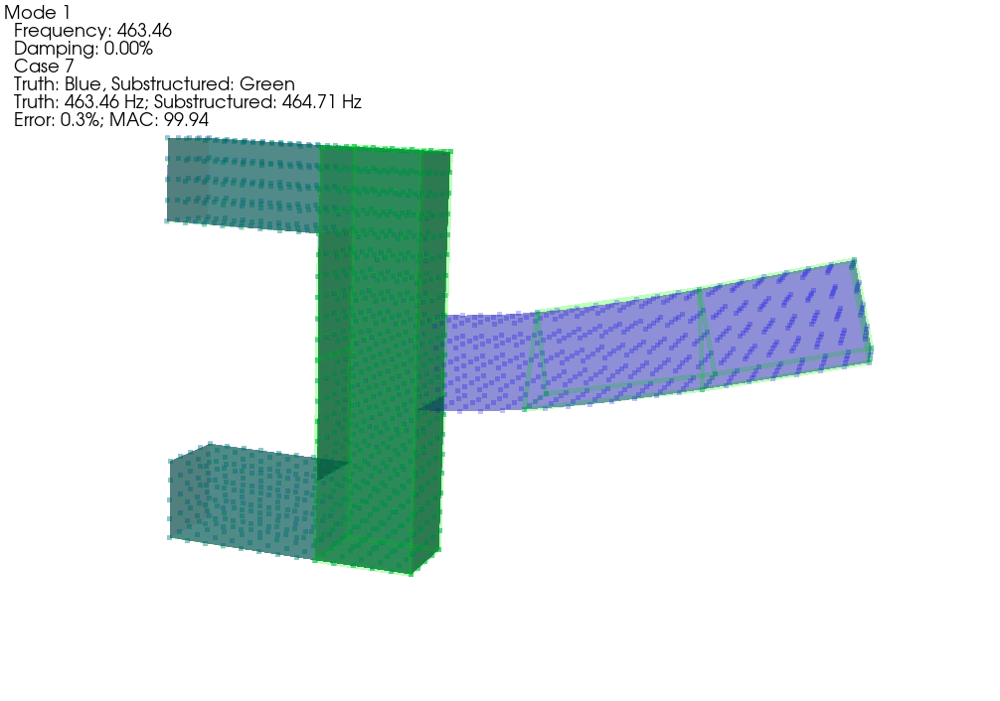

We see reasonably good results from this substructuring example.  As always with Experimental-to-Analytical substructuring, the limited bandwidth of the experimental substructure will often result in errors due to modal truncation.  The low frequency modes are often captured very well, while higher frequency modes show increased errors.

## Conclusions

SDynPy provides a consistent framework to perform structural dynamics analyses using the Python programming language.  It provides core data classes that mirror common data types found in structural dynamics.  These objects have the capability to simplify performing complex structural dynamics analyses by keeping track of geometry, transformations, and degrees of freedom.  SDynPy contains readers for common file types, state-of-the-art mode fitters to perform experimental modal analysis, and high-quality interactive data visualization tools.  The author hopes the release of this tool will encourage the growth of open-source software in structural dynamics by providing a common framework in which users can work.